# Data wrangling of an archaeological and natural history dataset from Fennoscandia

In [1]:
# Import libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
from shapely.geometry import Polygon
from pathlib import Path
from shapely import wkt
import json

In [2]:
# Set pandas view
pd.set_option('display.max_columns', None)

## 1. Import datasets

In [3]:
# Import transformed data (deleted first rows), Reference: https://doi.pangaea.de/10.1594/PANGAEA.905352
df_lake_mire = pd.read_csv(r'datasets_ad/Fennoscandia_lake_mire_isolation.tab', sep='\t')

In [4]:
# Import transformed data (deleted first rows), Reference: https://doi.pangaea.de/10.1594/PANGAEA.905352
df_archo = pd.read_csv(r'datasets_ad/Fennoscandia_archaeological_data.tab', sep='\t')

In [5]:
# Import fornsok data for geodata transformation
df_forn_cor = pd.read_json('fornsok_data/fornsok_data.json')

In [6]:
# Open Fornsok data to merge it with the goedata
with open('fornsok_data/fornsok_data.json','r') as f:
    forndata = json.loads(f.read())

In [7]:
# Import shapefile for clipping EPSG 3035, Corine dataset
clip_layer = gpd.read_file(r'clip_layer/clip_layer.shp')

In [8]:
# Import shapefile for clipping the soil dataset
clip_layer_soil = gpd.read_file(r'clip_layer_soil/Clipping_area.shp')

In [9]:
# Import soil dataset as shape, Reference: https://esdac.jrc.ec.europa.eu/tmp_dataset_access_req_62324#tabs-0-filters=1 and Jones, A., V. Stolbovoy, C. Tarnocai, G. Broll, O. Spaargaren and L. Montanarella (eds.), 2009, Soil Atlas of the Northern Circumpolar Region. European Commission, Office for Official Publications of the European Communities, Luxembourg. 142 pp.
soil_atlas_df = gpd.read_file(r'Northern_Soil_Map_all/Northern_Soil_Map_all.shp')

In [10]:
# Import Corine Land Cover 2018 as shape, Reference: https://land.copernicus.eu/pan-european/corine-land-cover
CLC_2018_df = gpd.read_file(r'Corine_Land_Cover_2018_v2020/DATA/U2018_CLC2018_V2020_20u1.gpkg')

In [11]:
# Import Randolph Glacier Inventory, Reference: https://nsidc.org/data/nsidc-0770/versions/6#anchor-1
glacier_inv = gpd.read_file(r'Randloph_Galcier_Inventory_Scandinavia/08_rgi60_Scandinavia.shp')

In [12]:
# Import quaternary glacier margins, Reference: https://www.elsevier.com/books/quaternary-glaciations-extent-and-chronology/ehlers/978-0-444-53447-7
hist_glacier_margins = gpd.read_file(r'hist_ice_margins/ice_margins.shp')

In [13]:
# Import glacier margins min/max, Reference: https://doi.pangaea.de/10.1594/PANGAEA.848117?format=html#download
glacier_margins_minMax = gpd.read_file(r'pub_glacier_dataset/glacier_stages_minMax_EPSG_3035.shp')

In [14]:
# Import glacier margins Stroeven, Reference: https://www.sciencedirect.com/science/article/pii/S0277379115301141
glacier_margins_stroeven = gpd.read_file(r'Stroeven_glacierdata/Fenno_degl_isochr_Stroeven_et_al.shp')

In [15]:
# Import roads from OpenStreetMap, Reference: https://download.geofabrik.de/europe/sweden.html
osm_roads = gpd.read_file(r'sweden-osm/gis_osm_roads_free_1.shp')

In [16]:
# Import railways from OpenStreetMap, Reference: https://download.geofabrik.de/europe/sweden.html
osm_railways = gpd.read_file(r'sweden-osm/gis_osm_railways_free_1.shp')

In [17]:
# Import buildings from OpenStreetMap, Reference: https://download.geofabrik.de/europe/sweden.html
#osm_buildings = gpd.read_file(r'sweden-osm/gis_osm_buildings_a_free_1.shp')

## 2. Review datasets

In [18]:
# Print dataframe
df_forn_cor

,lamning_id,lamningsnummer,lamningsversionstyp,aktivitetsref,lamningstyp_id,lamningstyp_namn,antikvariskbedomningtyp_id,antikvariskbedomningtyp_namn,antikvariskbedomning_motivering,antikvarisk_kommentar,rekommenderad_antikvariskbedomningtyp_id,rekommenderad_antikvariskbedomningtyp_namn,beskrivning,aktualitetstatus,undersokningsstatus,skadestatus,egenskaper,ingaendelamningar,kartmaterial_referenser,skriftlig_kalla_referenser,uppgiftslamnare_referenser,placeringtyp_id,placeringtyp_namn,alternativnamn,faltdatum,orientering,terrang,vegetation,tradition,nuvarande_lage,ursprungligt_lage,arkivobjekt_id,senast_andrad,reserverad_av_organisationsnamn,reserverad_info,registrerare_organisationsnamn,publiceringsdatum,publicerad_av_organisation,uri,legacy
0,0ecaca8b-38ee-442c-b4bd-11ebc21db716,L2000:1829,LamningsversionPublicerad,"{'aktivitetstyp': 'Atgard', 'atgard_id': '12b4...",101,Blästplats,1,Fornlämning,,2008-04-16 \nOmrådets läge och utbredning inmä...,1.0,Fornlämning,"Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...","{'aktualitetstatustyp_id': 1, 'aktualitetstatu...","{'undersokningsstatustyp_id': 3, 'undersokning...","{'skadestatustyp_id': 4, 'skadestatustyp_namn'...",[],"[{'lamningstyp_id': 1009, 'lamningstyp_namn': ...","[{'kartarkivtyp_id': 16, 'kartarkivtyp_namn': ...","[{'referens': 'ATA. Källström, I.: Inv. 1934, ...",[],1,Synlig ovan mark,[],2008-04-16,SSV delen är 15 m NÖ om skogsvägskurva mot NV.,Obetydlig moränrygg innanför delvis sumpig sjö...,None,None,"{'registreringsunderlagtyp_id': 101, 'registre...",None,aWlwYXg6Ly9vYmplY3RiYXNlLmRvY3VtZW50L2RvY3Bhcn...,2018-10-01T09:06:44,None,NaN,Riksantikvarieämbetet,2018-10-01T10:34:24,Riksantikvarieämbetet,https://pub.raa.se/objekt/lamning/0ecaca8b-38e...,"{'fmis_id': 10236007590001, 'raa_nummer': 'Lek..."
1,1cd461b4-f05c-4e7a-bb45-a7710b99150e,L2000:1894,LamningsversionPublicerad,"{'aktivitetstyp': 'Atgard', 'atgard_id': '12b4...",101,Blästplats,1,Fornlämning,,Återfunnen 2014.\n\nÄldre noteringar:\n2008-04...,1.0,Fornlämning,Järnframställningsplats. Inom ett 28 x 8 m st ...,"{'aktualitetstatustyp_id': 1, 'aktualitetstatu...","{'undersokningsstatustyp_id': 0, 'undersokning...","{'skadestatustyp_id': 4, 'skadestatustyp_namn'...",[],"[{'lamningstyp_id': 1009, 'lamningstyp_namn': ...",[],"[{'referens': 'ATA. Källström, I.: Inv. 1934, ...",[],1,Synlig ovan mark,[],2008-04-16,"14 m SV om väg (NV-SÖ), 50 m SSÖ om RAÄ nr 769.",Flack sandig moränmark. Skogsmark (tallskog).,None,None,"{'registreringsunderlagtyp_id': 101, 'registre...",None,aWlwYXg6Ly9vYmplY3RiYXNlLmRvY3VtZW50L2RvY3Bhcn...,2018-10-01T09:06:44,None,NaN,Riksantikvarieämbetet,2018-10-01T10:34:44,Riksantikvarieämbetet,https://pub.raa.se/objekt/lamning/1cd461b4-f05...,"{'fmis_id': 10236007700001, 'raa_nummer': 'Lek..."
2,ed960510-967a-4408-944f-d5ca7a5a9d23,L1998:2313,LamningsversionPublicerad,"{'aktivitetstyp': 'Atgard', 'atgard_id': '12b4...",102,Boplats,1,Fornlämning,,Osäker begränsning i V då en del ligger inom b...,1.0,Fornlämning,"Boplats, delundersökt. Inom ett ca 125x10-55 m...","{'aktualitetstatustyp_id': 1, 'aktualitetstatu...","{'undersokningsstatustyp_id': 0, 'undersokning...","{'skadestatustyp_id': 4, 'skadestatustyp_namn'...","[{'egenskapstyp_id': 10007, 'egenskapstyp_namn...",[],[],"[{'referens': 'Lindberg, K-F. & Sandberg, F. 2...",[],3,Ej synlig ovan mark,[],2014-09-05,None,None,None,None,"{'registreringsunderlagtyp_id': 104, 'registre...",None,aWlwYXg6Ly9vYmplY3RiYXNlLmRvY3VtZW50L2RvY3Bhcn...,2018-10-01T09:06:44,None,NaN,Riksantikvarieämbetet,2018-10-01T12:18:55,Riksantikvarieämbetet,https://pub.raa.se/objekt/lamning/ed960510-967...,"{'fmis_id': 12000000109019, 'raa_nummer': 'Lek..."
3,fc817c9e-8218-4e0c-b848-cc873457c64c,L1998:2542,LamningsversionPublicerad,"{'aktivitetstyp': 'Atgard', 'atgard_id': '12b4...",1032,Fossil åker,1,Fornlämning,,None,1.0,Fornlämning,"Fossil åker, oregelbunden, 45 m l (N-S) och 4-...","{'aktualitetstatustyp_id': 1, 'aktualitetstatu...","{'undersokningsstatustyp_id': 3, 'undersok

In [19]:
# Print dataframe
df_lake_mire

,Sample label,Location (Country/County),Type (Basin type),Lab label (Labnumber),Dated material,Latitude,Longitude,Age dated [ka] (Uncalibrated 14C (ka BP)),Age e [±] (Uncalibrated 14C (ka BP)),Elevation [m a.s.l.],URL source (Reference link),Reference (Original reference (short ver...),Reference (Reference (short version))
0,Nummensuo,Paimio,mire,Hel-494,gyttja,60.412,22.722,5.500,0.180,46.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...
1,Isosuo,Turku,mire,Hel-564,gyttja,60.507,22.244,4.950,0.140,42.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...
2,Sammalsuo,Laitila,mire,Hel-647,gyttja,60.804,21.864,5.030,0.200,48.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...
3,Iso Vuohensuo,Yläne,mire,Hel-652,gyttja,60.804,22.411,8.050,0.250,92.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...
4,Träskmossen,Tenhola,mire,Hel-669,gyttja,60.092,23.049,6.280,0.200,44.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1081,Betlehemsmyran,Sweden,NaN,Ua-15353,gyttja,62.623,17.845,6.135,0.065,100.9,NaN,Berglund. Holocene shore displacement and chro...,Berglund. Holocene shore displacement and chro...
1082,Mårtensmyran,Sweden,NaN,Ua-15354,gyttja,62.606,17.994,5.770,0.055,92.3,NaN,Berglund. Holocene shore displacement and chro...,Berglund. Holocene shore displacement and chro...
1083,Lapptjärnsmyran,Sweden,NaN,Ua-15355,gyttja,62.619,18.004,4.370,0.075,60.3,NaN,Berglund. Holocene shore displacement and chro...,Berglund. Holocene shore displacement and chro...
1084,Brattåsmyran,Sweden,NaN,Ua-15356,gyttja,62.582,17.874,3.910,0.060,48.0,NaN,Berglund. Holocene shore displacement and chro...,Berglund. Holocene shore displacement and chro...


In [20]:
# Print dataframe
df_archo

,Latitude,Longitude,Elevation [m a.s.l.],Age dated [ka] (Uncalibrated 14C (ka BP)),Age e [±] (Uncalibrated 14C (ka BP)),Sample label,Sample label (raa_number),Lab label (Labnumber),Location (County),Year obs [a AD] (Dating),Dated material,Reference,URL ref (OASIS: Open-access storage fo...),"URL ref (Insert ""raa_number"" in ""RAÄ_n...)",Comment (Additional information),Comment (Organization (see comment)),Name (Data registrant),Date (Data registration),Name (Data collector),Date (Data document)
0,64.183,23.699,5.0,0.420,0.110,Kalajoki,NaN,Hel-1062,NaN,1976,wood,Jungner H. and Sonninen E. 1983. Radiocarbon d...,https://www.oasisnorth.org/uploads/4/4/9/0/449...,NaN,Collected by Aartolahti T. 1976.,NaN,NaN,NaN,NaN,NaN
1,59.992,23.651,1.5,0.420,0.090,Raasepori. Tammisaari,NaN,Hel-1234,NaN,1978,wood,Jungner H. and Sonninen E. 1983. Radiocarbon d...,https://www.oasisnorth.org/uploads/4/4/9/0/449...,NaN,Collected by Raatikainen M. 1978.,NaN,NaN,NaN,NaN,NaN
2,64.264,23.860,12.0,0.420,0.130,Maristonpakka 1. Kalajoki,NaN,Hel-1862,NaN,1983,charcoal,Jungner H. and Sonninen E. 1989. Radiocarbon d...,https://www.oasisnorth.org/uploads/4/4/9/0/449...,NaN,"Alestalo, Jouko, 1971. Dendrochronological int...",NaN,NaN,NaN,NaN,NaN
3,59.948,20.878,10.0,0.540,0.080,Grave 4/90. choir,NaN,Hel-3459,NaN,1993,charcoal,Jungner H. and Sonninen E. 1998. Radiocarbon d...,https://www.oasisnorth.org/uploads/4/4/9/0/449...,NaN,"Gustavsson, Kenneth, 1997. Otterböte -- New L...",NaN,NaN,NaN,NaN,NaN
4,60.408,22.475,3.5,0.560,0.090,Sample 18,NaN,Hel-3376,NaN,1992,charcoal,Jungner H. and Sonninen E. 1998. Radiocarbon d...,https://www.oasisnorth.org/uploads/4/4/9/0/449...,NaN,"Uotila, Kari, 2001. Die Bischofsburg Kuusisto ...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1242,58.550,16.253,19.9,0.207,0.120,NaN,Tingstad 196,NaN,Norrköping,NaN,wood,NaN,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Hanna Larsson,2011-12-23,NaN,NaN
1243,58.350,15.108,120.8,2.247,0.130,NaN,Högby 98,NaN,Mjölby,NaN,charcoal,NaN,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Johan Andersson,2013-02-18,NaN,NaN
1244,65.104,21.073,93.7,0.184,0.030,NaN,Byske 276:1,NaN,Skellefteå,NaN,charcoal,NaN,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Anders Liberg,2014-04-04,Lennart Klang,1987-07-23
1245,57.746,14.657,284.4,4.977,0.034,NaN,Barkeryd 359,NaN,Nässjö,NaN,charcoal,NaN,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Thomas Axelsson,2014-11-21,NaN,NaN


In [21]:
# Print crs
soil_atlas_df.crs

<Derived Projected CRS: PROJCS["ncp07",GEOGCS["WGS 84",DATUM["WGS_1984",SP ...>
Name: ncp07
Axis Info [cartesian]:
- [south]: Easting (metre)
- [south]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Azimuthal Equal Area
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [22]:
# Print crs
clip_layer_soil.crs

<Derived Projected CRS: EPSG:3571>
Name: WGS 84 / North Pole LAEA Bering Sea
Axis Info [cartesian]:
- X[south]: Easting (metre)
- Y[south]: Northing (metre)
Area of Use:
- name: Northern hemisphere - north of 45°N, including Arctic.
- bounds: (-180.0, 45.0, 180.0, 90.0)
Coordinate Operation:
- name: North Pole Lambert Azimuthal Equal Area (Bering Sea)
- method: Lambert Azimuthal Equal Area
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
# Print crs
CLC_2018_df.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Europ

In [24]:
# Print crs
clip_layer.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Europ

In [25]:
# Print dataframe
glacier_inv.head(20)

,RGIId,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,Zmax,Zmed,Slope,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry
0,RGI60-08.00001,G033830E67930N,-9999999,-9999999,33.830,67.930,8,1,0.030,235,250,242,5.8,55,180,2,0,0,0,9,9,SU4C01001001 1,"POLYGON ((33.83233 67.92999, 33.83229 67.92984..."
1,RGI60-08.00002,G033500E67870N,-9999999,-9999999,33.500,67.870,8,1,0.030,228,246,239,5.7,352,177,2,0,0,0,9,9,SU4C01001002 2,"POLYGON ((33.50232 67.86999, 33.50229 67.86984..."
2,RGI60-08.00003,G033750E67820N,-9999999,-9999999,33.750,67.820,8,1,0.020,701,749,726,18.8,341,135,2,0,0,0,9,9,SU4C01001003 3,"POLYGON ((33.75189 67.81999, 33.75186 67.81987..."
3,RGI60-08.00004,G033770E67830N,-9999999,-9999999,33.770,67.830,8,1,0.020,671,725,696,20.1,329,125,2,0,0,0,9,9,SU4C01001004 4,"POLYGON ((33.77189 67.82999, 33.77187 67.82987..."
4,RGI60-08.00005,G016345E67139N,19990907,-9999999,16.345,67.139,8,1,21.469,926,1807,1268,8.5,152,9308,0,0,0,0,9,1,Salajekna,"POLYGON ((16.36842 67.12388, 16.36826 67.12393..."
5,RGI60-08.00006,G018055E68083N,20010820,-9999999,18.055,68.083,8,1,4.886,1160,1468,1399,7.5,96,1920,0,0,0,0,9,1,Riukojietna,"POLYGON ((18.01724 68.07631, 18.01711 68.07632..."
6,RGI60-08.00007,G018153E68104N,20020731,-9999999,18.153,68.104,8,1,0.137,1138,1215,1171,10.2,138,512,0,0,0,0,9,0,None,"POLYGON ((18.15556 68.10528, 18.15720 68.10485..."
7,RGI60-08.00008,G018166E68145N,20020731,-9999999,18.166,68.145,8,1,0.531,1153,1403,1261,17.0,68,890,0,0,0,0,9,0,Gallanvarri,"POLYGON ((18.16990 68.14780, 18.17057 68.14691..."
8,RGI60-08.00009,G018206E68118N,20020731,-9999999,18.206,68.118,8,1,0.734,1219,1480,1394,16.4,123,879,0,0,0,0,9,0,Gunganiehkki,"POLYGON ((18.22122 68.12118, 18.22234 68.12068..."
9,RGI60-08.00010,G018085E68122N,20020731,-9999999,18.085,68.122,8,1,0.303,1254,1423,1329,14.2,13,814,0,0,0,0,9,0,None,"POLYGON ((18.08519 68.12481, 18.08687 68.12405..."


In [26]:
# Print dataframe
hist_glacier_margins

,ID,FEATURE,SOURCE,geometry
0,0,Saalian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (-10.74605 52.52451, -10.81607 52.5..."
1,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (3.53694 59.77496, 3.51605 59.82115..."
2,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (85.37775 75.40124, 85.34501 75.459..."
3,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (11.04089 58.86844, 10.96570 58.906..."
4,0,LGM,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (0.04928 52.93167, -0.00932 52.9625..."
5,0,Early Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (38.08734 68.39229, 37.98086 68.366..."
6,0,"Early Weichselian maximum, minimum version","Svendsen et al., 2003 (QUEEN project)","LINESTRING (54.97525 67.78771, 54.86474 67.805..."


## 3. Modify datasets

### 3.1 Publication dataset

The publication dataset contains archaeological, lake and mire data including radiocarbon dates from Fennoscandia. Please see: https://doi.pangaea.de/10.1594/PANGAEA.905352

In [27]:
# Rename columns
df_lake_mire.rename(columns={"Location (Country/County)": "Location (County)"}, inplace=True)

In [28]:
# Rename columns
df_archo.rename(columns={"URL ref (OASIS: Open-access storage fo...)": "URL source (Reference link)", "Reference": "Reference (Original reference (short ver...)"}, inplace=True)

In [29]:
# Select columns for merge (concat)
frames = [df_lake_mire, df_archo] 

In [30]:
# Concat columns
df_archo_qual = pd.concat(frames)

In [31]:
# Print dataframe
df_archo_qual

,Sample label,Location (County),Type (Basin type),Lab label (Labnumber),Dated material,Latitude,Longitude,Age dated [ka] (Uncalibrated 14C (ka BP)),Age e [±] (Uncalibrated 14C (ka BP)),Elevation [m a.s.l.],URL source (Reference link),Reference (Original reference (short ver...),Reference (Reference (short version)),Sample label (raa_number),Year obs [a AD] (Dating),"URL ref (Insert ""raa_number"" in ""RAÄ_n...)",Comment (Additional information),Comment (Organization (see comment)),Name (Data registrant),Date (Data registration),Name (Data collector),Date (Data document)
0,Nummensuo,Paimio,mire,Hel-494,gyttja,60.412,22.722,5.500,0.180,46.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Isosuo,Turku,mire,Hel-564,gyttja,60.507,22.244,4.950,0.140,42.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Sammalsuo,Laitila,mire,Hel-647,gyttja,60.804,21.864,5.030,0.200,48.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Iso Vuohensuo,Yläne,mire,Hel-652,gyttja,60.804,22.411,8.050,0.250,92.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Träskmossen,Tenhola,mire,Hel-669,gyttja,60.092,23.049,6.280,0.200,44.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1242,NaN,Norrköping,NaN,NaN,wood,58.550,16.253,0.207,0.120,19.9,NaN,NaN,NaN,Tingstad 196,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Hanna Larsson,2011-12-23,NaN,NaN
1243,NaN,Mjölby,NaN,NaN,charcoal,58.350,15.108,2.247,0.130,120.8,NaN,NaN,NaN,Högby 98,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Johan Andersson,2013-02-18,NaN,NaN
1244,NaN,Skellefteå,NaN,NaN,charcoal,65.104,21.073,0.184,0.030,93.7,NaN,NaN,NaN,Byske 276:1,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Anders Liberg,2014-04-04,Lennart Klang,1987-07-23
1245,NaN,Nässjö,NaN,NaN,charcoal,57.746,14.657,4.977,0.034,284.4,NaN,NaN,NaN,Barkeryd 359,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Thomas Axelsson,2014-11-21,NaN,NaN


In [32]:
# Reset index
df_archo_qual.reset_index(inplace=True)

In [33]:
# Drop columns
df_archo_qual.drop(['index'], axis=1, inplace=True)

In [34]:
# Insert Reference
df_archo_qual["Ref_data"] = "Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (2019): Land uplift modelling data including lake and mire isolation and archaeological data from Fennoscandia. PANGAEA"

In [35]:
# Insert Reference-link
df_archo_qual["Ref_link"] = "https://doi.pangaea.de/10.1594/PANGAEA.905352"

In [36]:
# Create geodataframe with geopandas
gdf_archo_qual1 = gpd.GeoDataFrame(df_archo_qual, geometry=gpd.points_from_xy(df_archo_qual.Longitude, df_archo_qual.Latitude))

In [37]:
# Set Coordinate-system with geopandas
gdf_archo_qual1.set_crs('epsg:4326', inplace=True)

,Sample label,Location (County),Type (Basin type),Lab label (Labnumber),Dated material,Latitude,Longitude,Age dated [ka] (Uncalibrated 14C (ka BP)),Age e [±] (Uncalibrated 14C (ka BP)),Elevation [m a.s.l.],URL source (Reference link),Reference (Original reference (short ver...),Reference (Reference (short version)),Sample label (raa_number),Year obs [a AD] (Dating),"URL ref (Insert ""raa_number"" in ""RAÄ_n...)",Comment (Additional information),Comment (Organization (see comment)),Name (Data registrant),Date (Data registration),Name (Data collector),Date (Data document),Ref_data,Ref_link,geometry
0,Nummensuo,Paimio,mire,Hel-494,gyttja,60.412,22.722,5.500,0.180,46.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (22.72200 60.41200)
1,Isosuo,Turku,mire,Hel-564,gyttja,60.507,22.244,4.950,0.140,42.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (22.24400 60.50700)
2,Sammalsuo,Laitila,mire,Hel-647,gyttja,60.804,21.864,5.030,0.200,48.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (21.86400 60.80400)
3,Iso Vuohensuo,Yläne,mire,Hel-652,gyttja,60.804,22.411,8.050,0.250,92.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (22.41100 60.80400)
4,Träskmossen,Tenhola,mire,Hel-669,gyttja,60.092,23.049,6.280,0.200,44.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (23.04900 60.09200)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2328,NaN,Norrköping,NaN,NaN,wood,58.550,16.253,0.207,0.120,19.9,NaN,NaN,NaN,Tingstad 196,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Hanna Larsson,2011-12-23,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (16.25300 58.55000)
2329,NaN,Mjölby,NaN,NaN,charcoal,58.350,15.108,2.247,0.130,120.8,NaN,NaN,NaN,Högby 98,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Johan Andersson,2013-02-18,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (15.10800 58.35000)
2330,NaN,Skellefteå,NaN,NaN,charcoal,65.104,21.073,0.184,0.030,93.7,NaN,NaN,NaN,Byske 276:1,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Anders Liberg,2014-04-04,Lennart Klang,1987-07-23,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (21.07300 65.10400)
2331,NaN,Nässjö,NaN,NaN,charcoal,57.746,14.657,4.977,0.034,284.4,NaN,NaN,NaN,Barkeryd 359,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Thomas Axelsson,2014-11-21,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (14.65700 57.74600)


In [38]:
# Transformation due to the coordinate system of the CLC dataset
gdf_archo_qual1.to_crs(3035, inplace = True)

In [39]:
# Review geodataframe
gdf_archo_qual1

,Sample label,Location (County),Type (Basin type),Lab label (Labnumber),Dated material,Latitude,Longitude,Age dated [ka] (Uncalibrated 14C (ka BP)),Age e [±] (Uncalibrated 14C (ka BP)),Elevation [m a.s.l.],URL source (Reference link),Reference (Original reference (short ver...),Reference (Reference (short version)),Sample label (raa_number),Year obs [a AD] (Dating),"URL ref (Insert ""raa_number"" in ""RAÄ_n...)",Comment (Additional information),Comment (Organization (see comment)),Name (Data registrant),Date (Data registration),Name (Data collector),Date (Data document),Ref_data,Ref_link,geometry
0,Nummensuo,Paimio,mire,Hel-494,gyttja,60.412,22.722,5.500,0.180,46.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (5019605.702 4208701.095)
1,Isosuo,Turku,mire,Hel-564,gyttja,60.507,22.244,4.950,0.140,42.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4991749.430 4214472.572)
2,Sammalsuo,Laitila,mire,Hel-647,gyttja,60.804,21.864,5.030,0.200,48.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4965329.433 4243479.043)
3,Iso Vuohensuo,Yläne,mire,Hel-652,gyttja,60.804,22.411,8.050,0.250,92.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4994684.303 4248582.788)
4,Träskmossen,Tenhola,mire,Hel-669,gyttja,60.092,23.049,6.280,0.200,44.0,https://www.oasisnorth.org/uploads/4/4/9/0/449...,Glückert. Post-Glacial shore-level displacemen...,Vuorela et al. Review of Bothnian Sea shore-l...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (5044211.536 4176982.830)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2328,NaN,Norrköping,NaN,NaN,wood,58.550,16.253,0.207,0.120,19.9,NaN,NaN,NaN,Tingstad 196,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Hanna Larsson,2011-12-23,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4685164.265 3954743.336)
2329,NaN,Mjölby,NaN,NaN,charcoal,58.350,15.108,2.247,0.130,120.8,NaN,NaN,NaN,Högby 98,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Johan Andersson,2013-02-18,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4620293.969 3927239.890)
2330,NaN,Skellefteå,NaN,NaN,charcoal,65.104,21.073,0.184,0.030,93.7,NaN,NaN,NaN,Byske 276:1,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Anders Liberg,2014-04-04,Lennart Klang,1987-07-23,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4842282.628 4707738.361)
2331,NaN,Nässjö,NaN,NaN,charcoal,57.746,14.657,4.977,0.034,284.4,NaN,NaN,NaN,Barkeryd 359,NaN,https://app.raa.se/open/fornsok/lamning-query,NaN,Riksantikvarieämbetet,Thomas Axelsson,2014-11-21,NaN,NaN,"Pohjola, Jari; Turunen, Jari; Lipping, Tarmo (...",https://doi.pangaea.de/10.1594/PANGAEA.905352,POINT (4598478.607 3858390.129)


### 3.2 Fornsok dataset

The fornsok dataset contains archaeological data from Sweden, which was queried and downloaded using the search term C14 at https://app.raa.se/open/fornsok/searchlamning.

#### 3.2.1 Transform Fornsok dataset with coordinates 

In [40]:
# Create list for coordinate transformation
forn_2 = pd.DataFrame(df_forn_cor.nuvarande_lage.values.tolist())["geometri"]

In [41]:
# Print list
forn_2

0       {'type': 'FeatureCollection', 'crs': {'type': ...
1       {'type': 'FeatureCollection', 'crs': {'type': ...
2       {'type': 'FeatureCollection', 'crs': {'type': ...
3       {'type': 'FeatureCollection', 'crs': {'type': ...
4       {'type': 'FeatureCollection', 'crs': {'type': ...
                              ...                        
1445    {'type': 'FeatureCollection', 'crs': {'type': ...
1446    {'type': 'FeatureCollection', 'crs': {'type': ...
1447    {'type': 'FeatureCollection', 'crs': {'type': ...
1448    {'type': 'FeatureCollection', 'crs': {'type': ...
1449    {'type': 'FeatureCollection', 'crs': {'type': ...
Name: geometri, Length: 1450, dtype: object

In [42]:
# Create dataframe for coordinate transformation
df_fornsok_coord = pd.DataFrame.from_records(forn_2)

In [43]:
# Print dataframe
df_fornsok_coord

,type,crs,features
0,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
1,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
2,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
3,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
4,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
...,...,...,...
1445,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Poi..."
1446,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
1447,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."
1448,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol..."


In [44]:
# Get coordinates from JSON key 
df_fornsok_coord['coordinates'] = [x[0]['geometry'] for x in df_fornsok_coord['features']]

In [45]:
# Print dataframe
df_fornsok_coord

,type,crs,features,coordinates
0,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[486876.2..."
1,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[486949.1..."
2,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[498397.8..."
3,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[488337.1..."
4,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[488254.4..."
...,...,...,...,...
1445,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Poi...","{'type': 'Point', 'coordinates': [486014.562, ..."
1446,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[484035.8..."
1447,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[484330.6..."
1448,FeatureCollection,"{'type': 'name', 'properties': {'name': 'EPSG:...","[{'type': 'Feature', 'geometry': {'type': 'Pol...","{'type': 'Polygon', 'coordinates': [[[483910.1..."


In [46]:
# Transform geocoordinates
gdf_fornsok_cord = gpd.GeoDataFrame.from_features(df_fornsok_coord["coordinates"].apply(lambda g: {"geometry": g, "properties": {}}))

In [47]:
# Print geodataframe
gdf_fornsok_cord

,geometry
0,"POLYGON ((486876.226 6740121.912, 486883.874 6..."
1,"POLYGON ((486949.147 6739914.047, 486979.581 6..."
2,"POLYGON ((498397.886 6734875.736, 498396.901 6..."
3,"POLYGON ((488337.166 6727461.784, 488339.829 6..."
4,"POLYGON ((488254.438 6727443.583, 488265.581 6..."
...,...
1445,POINT (486014.562 6460992.489)
1446,"POLYGON ((484035.897 6455495.806, 484022.382 6..."
1447,"POLYGON ((484330.602 6455587.058, 484334.273 6..."
1448,"POLYGON ((483910.155 6455452.784, 483914.194 6..."


#### 3.2.2 Transform and merge fornsok dataset with coordinates-dataset  

In [48]:
# Normalize fornsok dataset
first_fornsok_df = pd.json_normalize(forndata)

In [49]:
# Drop columns
first_fornsok_df.drop(['nuvarande_lage.geometri.crs.properties.name', 'nuvarande_lage.geometri.crs.type', "nuvarande_lage.geometri.type", "lamning_id", "lamningsversionstyp", "nuvarande_lage.matmetodtyp_id", "nuvarande_lage.registreringsunderlagkvalitettyp_namn", "nuvarande_lage.registreringsunderlagkvalitettyp_id", "nuvarande_lage.registreringsunderlagtyp_namn", "nuvarande_lage.registreringsunderlagtyp_id", "skadestatus.skadestatustyp_namn", "skadestatus.skadestatustyp_id", "undersokningsstatus.undersokningsstatustyp_namn", "undersokningsstatus.undersokningsstatustyp_id", "aktualitetstatus.aktualitetstatustyp_namn", "aktualitetstatus.aktualitetstatustyp_id", "aktivitetsref.senast_andrad", "aktivitetsref.registreringstid", "aktivitetsref.referens", "aktivitetsref.beskrivning", "aktivitetsref.atgardtyp_namn", "aktivitetsref.atgardtyp_id", "aktivitetsref.atgardsnummer", "aktivitetsref.atgard_id", "aktivitetsref.aktivitetstyp", "publicerad_av_organisation", "publiceringsdatum", "registrerare_organisationsnamn", "senast_andrad", "arkivobjekt_id", "placeringtyp_id", "rekommenderad_antikvariskbedomningtyp_id", "antikvariskbedomningtyp_id", "lamningstyp_id", "lamningsnummer", "legacy.fmis_id", "legacy.raa_nummer", "aktivitetsref.uppdrag_id", "aktivitetsref.uppdragsnummer"], axis=1, inplace=True)

In [50]:
# Load json
json_fornsok = json.loads(first_fornsok_df.to_json(orient='records'))

In [51]:
# Please, see: https://towardsdatascience.com/how-to-flatten-deeply-nested-json-objects-in-non-recursive-elegant-python-55f96533103d

def flatten_json(nested_json):
    out = {}

    def flatten(x, name=''):
        if type(x) is dict:
            for a in x:
                flatten(x[a], name + a + '_')
        elif type(x) is list:
            i = 0
            for a in x:
                flatten(a, name + str(i) + '_')
                i += 1
        else:
            out[name[:-1]] = x

    flatten(nested_json)
    return out

In [52]:
# Flatten json into dataframe
fornsok_df = pd.DataFrame([flatten_json(x) for x in json_fornsok])

In [53]:
# Print dataframe
fornsok_df

lamningstyp_namn antikvariskbedomningtyp_namn  \
0          Blästplats                  Fornlämning   
1          Blästplats                  Fornlämning   
2             Boplats                  Fornlämning   
3         Fossil åker                  Fornlämning   
4         Fossil åker                  Fornlämning   
...               ...                          ...   
1445             Härd  Ingen antikvarisk bedömning   
1446       Blästplats  Ingen antikvarisk bedömning   
1447    Boplatsområde  Ingen antikvarisk bedömning   
1448    Boplatsområde  Ingen antikvarisk bedömning   
1449    Boplatsområde  Ingen antikvarisk bedömning   

                        antikvariskbedomning_motivering  \
0                                                         
1                                                         
2                                                         
3                                                         
4                                                         
...                                                 ...   
1445  Den antikvariska bedömningen är migrerad från ...   
1446  Den antikvariska bedömningen är migrerad från ...   
1447  Den antikvariska bedömningen är migrerad från ...   
1448  Den antikvariska bedömningen är migrerad från ...   
1449  Den antikvariska bedömningen är migrerad från ...   

                                  antikvarisk_kommentar  \
0     2008-04-16 \nOmrådets läge och utbredning inmä...   
1     Återfunnen 2014.\n\nÄldre noteringar:\n2008-04...   
2     Osäker begränsning i V då en del ligger inom b...   
3                                                  None   
4                                                  None   
...                                                 ...   
1445                                               None   
1446                                               None   
1447                                               None   
1448                                               None   
1449                                               None   

     rekommenderad_antikvariskbedomningtyp_namn  \
0                                   Fornlämning   
1                                   Fornlämning   
2                                   Fornlämning   
3                                   Fornlämning   
4                                   Fornlämning   
...                                         ...   
1445                                Fornlämning   
1446                                Fornlämning   
1447                                Fornlämning   
1448                                Fornlämning   
1449                                Fornlämning   

                                            beskrivning  \
0     Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
1     Järnframställningsplats. Inom ett 28 x 8 m st ...   
2     Boplats, delundersökt. Inom ett ca 125x10-55 m...   
3     Fossil åker, oregelbunden, 45 m l (N-S) och 4-...   
4     Fossil åker, 45m l (NV-SÖ) och 6-8 m br.\nUtme...   
...                                                 ...   
1445  Härd, undersökt och bortagen år 2001, ca 0,8 m...   
1446  Järnframställningsplats, ca 70 m diam, undersö...   
1447  Boplats, ca 50x40 m (N-S), undersökt och bortt...   
1448  Boplats, ca 95x75 m (ÖNÖ-VSV), undersökt och b...   
1449  Boplats, okänd utbredning, ca 25x8 m (NÖ-SV). ...   

      ingaendelamningar_0_lamningstyp_id ingaendelamningar_0_lamningstyp_namn  \
0                                 1009.0                    Blästbrukslämning   
1                                 1009.0                    Blästbrukslämning   
2                                    NaN                                  NaN   
3                                    NaN                                  NaN   
4                                    NaN                                  NaN   
...                                  ...                                  ...   
1445                                 NaN         

In [54]:
# Insert Reference
fornsok_df["Ref_data"] = "C14 search query in the Fornsök database"

In [55]:
# Insert Reference-link
fornsok_df["Ref_link"] = "https://app.raa.se/open/fornsok/searchlamning"

In [56]:
# Concat datasets
df_fornsok_data = pd.concat([fornsok_df, gdf_fornsok_cord], axis=1)

In [57]:
# Print dataframe
df_fornsok_data

lamningstyp_namn antikvariskbedomningtyp_namn  \
0          Blästplats                  Fornlämning   
1          Blästplats                  Fornlämning   
2             Boplats                  Fornlämning   
3         Fossil åker                  Fornlämning   
4         Fossil åker                  Fornlämning   
...               ...                          ...   
1445             Härd  Ingen antikvarisk bedömning   
1446       Blästplats  Ingen antikvarisk bedömning   
1447    Boplatsområde  Ingen antikvarisk bedömning   
1448    Boplatsområde  Ingen antikvarisk bedömning   
1449    Boplatsområde  Ingen antikvarisk bedömning   

                        antikvariskbedomning_motivering  \
0                                                         
1                                                         
2                                                         
3                                                         
4                                                         
...                                                 ...   
1445  Den antikvariska bedömningen är migrerad från ...   
1446  Den antikvariska bedömningen är migrerad från ...   
1447  Den antikvariska bedömningen är migrerad från ...   
1448  Den antikvariska bedömningen är migrerad från ...   
1449  Den antikvariska bedömningen är migrerad från ...   

                                  antikvarisk_kommentar  \
0     2008-04-16 \nOmrådets läge och utbredning inmä...   
1     Återfunnen 2014.\n\nÄldre noteringar:\n2008-04...   
2     Osäker begränsning i V då en del ligger inom b...   
3                                                  None   
4                                                  None   
...                                                 ...   
1445                                               None   
1446                                               None   
1447                                               None   
1448                                               None   
1449                                               None   

     rekommenderad_antikvariskbedomningtyp_namn  \
0                                   Fornlämning   
1                                   Fornlämning   
2                                   Fornlämning   
3                                   Fornlämning   
4                                   Fornlämning   
...                                         ...   
1445                                Fornlämning   
1446                                Fornlämning   
1447                                Fornlämning   
1448                                Fornlämning   
1449                                Fornlämning   

                                            beskrivning  \
0     Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
1     Järnframställningsplats. Inom ett 28 x 8 m st ...   
2     Boplats, delundersökt. Inom ett ca 125x10-55 m...   
3     Fossil åker, oregelbunden, 45 m l (N-S) och 4-...   
4     Fossil åker, 45m l (NV-SÖ) och 6-8 m br.\nUtme...   
...                                                 ...   
1445  Härd, undersökt och bortagen år 2001, ca 0,8 m...   
1446  Järnframställningsplats, ca 70 m diam, undersö...   
1447  Boplats, ca 50x40 m (N-S), undersökt och bortt...   
1448  Boplats, ca 95x75 m (ÖNÖ-VSV), undersökt och b...   
1449  Boplats, okänd utbredning, ca 25x8 m (NÖ-SV). ...   

      ingaendelamningar_0_lamningstyp_id ingaendelamningar_0_lamningstyp_namn  \
0                                 1009.0                    Blästbrukslämning   
1                                 1009.0                    Blästbrukslämning   
2                                    NaN                                  NaN   
3                                    NaN                                  NaN   
4                                    NaN                                  NaN   
...                                  ...                                  ...   
1445                                 NaN         

In [58]:
# Transform merged dataset into a geodataframe
gdf_fornsok_data = gpd.GeoDataFrame(df_fornsok_data, geometry='geometry')

In [59]:
# Set geocoordinates
gdf_fornsok_data.set_crs('epsg:3006', inplace=True)

lamningstyp_namn antikvariskbedomningtyp_namn  \
0          Blästplats                  Fornlämning   
1          Blästplats                  Fornlämning   
2             Boplats                  Fornlämning   
3         Fossil åker                  Fornlämning   
4         Fossil åker                  Fornlämning   
...               ...                          ...   
1445             Härd  Ingen antikvarisk bedömning   
1446       Blästplats  Ingen antikvarisk bedömning   
1447    Boplatsområde  Ingen antikvarisk bedömning   
1448    Boplatsområde  Ingen antikvarisk bedömning   
1449    Boplatsområde  Ingen antikvarisk bedömning   

                        antikvariskbedomning_motivering  \
0                                                         
1                                                         
2                                                         
3                                                         
4                                                         
...                                                 ...   
1445  Den antikvariska bedömningen är migrerad från ...   
1446  Den antikvariska bedömningen är migrerad från ...   
1447  Den antikvariska bedömningen är migrerad från ...   
1448  Den antikvariska bedömningen är migrerad från ...   
1449  Den antikvariska bedömningen är migrerad från ...   

                                  antikvarisk_kommentar  \
0     2008-04-16 \nOmrådets läge och utbredning inmä...   
1     Återfunnen 2014.\n\nÄldre noteringar:\n2008-04...   
2     Osäker begränsning i V då en del ligger inom b...   
3                                                  None   
4                                                  None   
...                                                 ...   
1445                                               None   
1446                                               None   
1447                                               None   
1448                                               None   
1449                                               None   

     rekommenderad_antikvariskbedomningtyp_namn  \
0                                   Fornlämning   
1                                   Fornlämning   
2                                   Fornlämning   
3                                   Fornlämning   
4                                   Fornlämning   
...                                         ...   
1445                                Fornlämning   
1446                                Fornlämning   
1447                                Fornlämning   
1448                                Fornlämning   
1449                                Fornlämning   

                                            beskrivning  \
0     Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
1     Järnframställningsplats. Inom ett 28 x 8 m st ...   
2     Boplats, delundersökt. Inom ett ca 125x10-55 m...   
3     Fossil åker, oregelbunden, 45 m l (N-S) och 4-...   
4     Fossil åker, 45m l (NV-SÖ) och 6-8 m br.\nUtme...   
...                                                 ...   
1445  Härd, undersökt och bortagen år 2001, ca 0,8 m...   
1446  Järnframställningsplats, ca 70 m diam, undersö...   
1447  Boplats, ca 50x40 m (N-S), undersökt och bortt...   
1448  Boplats, ca 95x75 m (ÖNÖ-VSV), undersökt och b...   
1449  Boplats, okänd utbredning, ca 25x8 m (NÖ-SV). ...   

      ingaendelamningar_0_lamningstyp_id ingaendelamningar_0_lamningstyp_namn  \
0                                 1009.0                    Blästbrukslämning   
1                                 1009.0                    Blästbrukslämning   
2                                    NaN                                  NaN   
3                                    NaN                                  NaN   
4                                    NaN                                  NaN   
...                                  ...                                  ...   
1445                                 NaN         

In [60]:
# Transformation due to the coordinate system of the fornsok dataset
gdf_fornsok_data.to_crs(3035, inplace = True)

<AxesSubplot:>

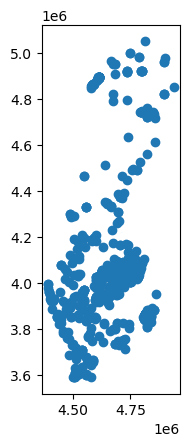

In [61]:
# Print geodataframe
gdf_fornsok_data.plot()

In [62]:
# Print geodataframe
gdf_fornsok_data

lamningstyp_namn antikvariskbedomningtyp_namn  \
0          Blästplats                  Fornlämning   
1          Blästplats                  Fornlämning   
2             Boplats                  Fornlämning   
3         Fossil åker                  Fornlämning   
4         Fossil åker                  Fornlämning   
...               ...                          ...   
1445             Härd  Ingen antikvarisk bedömning   
1446       Blästplats  Ingen antikvarisk bedömning   
1447    Boplatsområde  Ingen antikvarisk bedömning   
1448    Boplatsområde  Ingen antikvarisk bedömning   
1449    Boplatsområde  Ingen antikvarisk bedömning   

                        antikvariskbedomning_motivering  \
0                                                         
1                                                         
2                                                         
3                                                         
4                                                         
...                                                 ...   
1445  Den antikvariska bedömningen är migrerad från ...   
1446  Den antikvariska bedömningen är migrerad från ...   
1447  Den antikvariska bedömningen är migrerad från ...   
1448  Den antikvariska bedömningen är migrerad från ...   
1449  Den antikvariska bedömningen är migrerad från ...   

                                  antikvarisk_kommentar  \
0     2008-04-16 \nOmrådets läge och utbredning inmä...   
1     Återfunnen 2014.\n\nÄldre noteringar:\n2008-04...   
2     Osäker begränsning i V då en del ligger inom b...   
3                                                  None   
4                                                  None   
...                                                 ...   
1445                                               None   
1446                                               None   
1447                                               None   
1448                                               None   
1449                                               None   

     rekommenderad_antikvariskbedomningtyp_namn  \
0                                   Fornlämning   
1                                   Fornlämning   
2                                   Fornlämning   
3                                   Fornlämning   
4                                   Fornlämning   
...                                         ...   
1445                                Fornlämning   
1446                                Fornlämning   
1447                                Fornlämning   
1448                                Fornlämning   
1449                                Fornlämning   

                                            beskrivning  \
0     Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
1     Järnframställningsplats. Inom ett 28 x 8 m st ...   
2     Boplats, delundersökt. Inom ett ca 125x10-55 m...   
3     Fossil åker, oregelbunden, 45 m l (N-S) och 4-...   
4     Fossil åker, 45m l (NV-SÖ) och 6-8 m br.\nUtme...   
...                                                 ...   
1445  Härd, undersökt och bortagen år 2001, ca 0,8 m...   
1446  Järnframställningsplats, ca 70 m diam, undersö...   
1447  Boplats, ca 50x40 m (N-S), undersökt och bortt...   
1448  Boplats, ca 95x75 m (ÖNÖ-VSV), undersökt och b...   
1449  Boplats, okänd utbredning, ca 25x8 m (NÖ-SV). ...   

      ingaendelamningar_0_lamningstyp_id ingaendelamningar_0_lamningstyp_namn  \
0                                 1009.0                    Blästbrukslämning   
1                                 1009.0                    Blästbrukslämning   
2                                    NaN                                  NaN   
3                                    NaN                                  NaN   
4                                    NaN                                  NaN   
...                                  ...                                  ...   
1445                                 NaN         

### 3.3 Soil dataset, 2008

The soil dataset contains different soil classes. Please see: https://www.fao.org/3/i3794en/I3794en.pdf

In [63]:
# Print dataframe
soil_atlas_df.head()

,WRB_L1,WRB_L2,Country,geometry
0,None,None,Eurasia,"POLYGON ((73909.799 3252992.649, 73104.204 325..."
1,None,None,Eurasia,"POLYGON ((70324.800 3252945.006, 69927.324 325..."
2,None,None,Eurasia,"POLYGON ((72878.671 3255030.972, 72592.713 325..."
3,None,None,Eurasia,"POLYGON ((68757.545 3255230.542, 68622.684 325..."
4,None,None,Eurasia,"POLYGON ((66526.822 3259005.072, 66117.524 325..."


In [64]:
# Review crs
soil_atlas_df.crs

<Derived Projected CRS: PROJCS["ncp07",GEOGCS["WGS 84",DATUM["WGS_1984",SP ...>
Name: ncp07
Axis Info [cartesian]:
- [south]: Easting (metre)
- [south]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Azimuthal Equal Area
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [65]:
# Transformation due to the coordinate system of the Soil-Atlas dataset
soil_atlas_df.to_crs(3571)

,WRB_L1,WRB_L2,Country,geometry
0,None,None,Eurasia,"POLYGON ((73909.799 3252992.649, 73104.204 325..."
1,None,None,Eurasia,"POLYGON ((70324.800 3252945.006, 69927.324 325..."
2,None,None,Eurasia,"POLYGON ((72878.671 3255030.972, 72592.713 325..."
3,None,None,Eurasia,"POLYGON ((68757.545 3255230.542, 68622.684 325..."
4,None,None,Eurasia,"POLYGON ((66526.822 3259005.072, 66117.524 325..."
...,...,...,...,...
38482,VR,None,Canada,"POLYGON ((3988983.103 -1391818.809, 3989184.18..."
38483,VR,None,Canada,"POLYGON ((4007418.390 -1439663.533, 4006167.11..."
38484,VR,None,Canada,"POLYGON ((3972600.153 -1438843.916, 3972509.84..."
38485,VR,None,Canada,"POLYGON ((4027576.848 -1438007.335, 4028126.90..."


In [66]:
# Print crs
clip_layer_soil.crs

<Derived Projected CRS: EPSG:3571>
Name: WGS 84 / North Pole LAEA Bering Sea
Axis Info [cartesian]:
- X[south]: Easting (metre)
- Y[south]: Northing (metre)
Area of Use:
- name: Northern hemisphere - north of 45°N, including Arctic.
- bounds: (-180.0, 45.0, 180.0, 90.0)
Coordinate Operation:
- name: North Pole Lambert Azimuthal Equal Area (Bering Sea)
- method: Lambert Azimuthal Equal Area
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [67]:
# Clip Soil-Atlas dataset
soil_atlas_clipped_df = soil_atlas_df.clip(clip_layer_soil)

<AxesSubplot:>

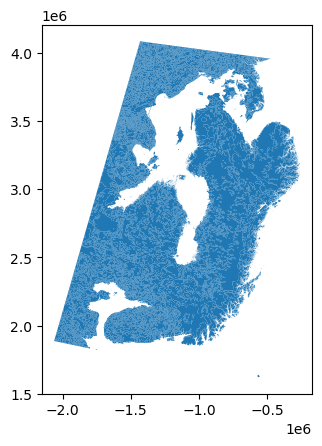

In [68]:
# Plot geodataframe
soil_atlas_clipped_df.plot()

In [69]:
# Insert Reference
soil_atlas_clipped_df["Ref_data"] = "WRB, Soil Atlas of the Northern Circumpolar Region, 2008"

In [70]:
# Insert Reference-link
soil_atlas_clipped_df["Ref_link"] = "https://esdac.jrc.ec.europa.eu/content/soil-atlas-northern-circumpolar-region"

In [71]:
# Print dataframe
soil_atlas_clipped_df

,WRB_L1,WRB_L2,Country,geometry,Ref_data,Ref_link
8636,CR,CRhi,Eurasia,"MULTIPOLYGON (((-1841483.581 1840931.251, -183...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
3086,AB,ABhi,Eurasia,"POLYGON ((-1901508.551 1876809.866, -1901907.9...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
13790,HS,HScy,Eurasia,"POLYGON ((-1900172.895 1864222.658, -1900715.2...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
13794,HS,HScy,Eurasia,"MULTIPOLYGON (((-1856367.927 1878423.960, -185...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
28289,PZ,PZrs,Eurasia,"POLYGON ((-1895309.641 1852582.050, -1895033.3...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
...,...,...,...,...,...,...
6623,CM,CMeu,Eurasia,"POLYGON ((-1400789.042 4072154.996, -1400274.5...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
6636,CM,CMeu,Eurasia,"POLYGON ((-1428845.596 4078540.120, -1427559.6...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
22790,LV,LVha,Eurasia,"POLYGON ((-1368501.417 4075553.481, -1367987.9...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...
27202,PZ,PZha,Eurasia,"POLYGON ((-1376063.555 4077316.207, -1376147.2...","WRB, Soil Atlas of the Northern Circumpolar Re...",https://esdac.jrc.ec.europa.eu/content/soil-at...


In [72]:
# Review crs
soil_atlas_clipped_df.crs

<Derived Projected CRS: PROJCS["ncp07",GEOGCS["WGS 84",DATUM["WGS_1984",SP ...>
Name: ncp07
Axis Info [cartesian]:
- [south]: Easting (metre)
- [south]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Azimuthal Equal Area
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [73]:
# Transformation due to the coordinate system of the clipped Soil-Atlas dataset
soil_atlas_clipped_df.to_crs(3035, inplace = True)

<AxesSubplot:>

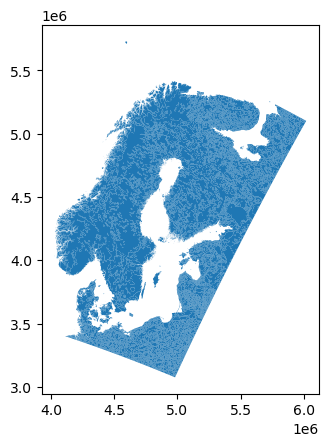

In [74]:
# Plot geodataframe
soil_atlas_clipped_df.plot()

In [75]:
# Reset index
soil_atlas_clipped_df.reset_index(drop=True, inplace=True)

### 3.4 Corine Landcover dataset, 2018 

The Corine landcover dataset contains different classes, including: anthropogenic surfaces, agricultural areas, forest and seminatural areas, wetlands and water bodies. Please see: https://land.copernicus.eu/user-corner/technical-library/corine-land-cover-nomenclature-guidelines/html/index.html

In [76]:
# Clip Corine landcover dataset
CLC_2018_clipped_df = CLC_2018_df.clip(clip_layer)

In [77]:
# Insert Reference
CLC_2018_clipped_df["Ref_data"] = "CORINE Land Cover (CLC), 2018"

In [78]:
# Insert Reference-link
CLC_2018_clipped_df["Ref_link"] = "https://land.copernicus.eu/pan-european/corine-land-cover/clc2018"

In [79]:
# Print dataframe
CLC_2018_clipped_df.head()

,Code_18,Remark,Area_Ha,ID,geometry,Ref_data,Ref_link
2364603,511,None,84117.024210,EU_2364604,"MULTIPOLYGON (((3923972.120 3218297.390, 39242...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1182134,312,None,14902.554166,EU_1182135,"MULTIPOLYGON (((4183254.230 3151783.510, 41832...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1175261,231,None,1930.502595,EU_1175262,"MULTIPOLYGON (((4212124.320 3152736.790, 42119...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1179090,311,None,159.012275,EU_1179091,"MULTIPOLYGON (((4208693.970 3152637.350, 42087...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1179127,311,None,641.667902,EU_1179128,"POLYGON ((4203082.210 3152505.880, 4203084.910...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...


In [80]:
# Review crs
CLC_2018_clipped_df.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Europ

In [81]:
# Transformation due to the coordinate system of the CLC dataset
CLC_2018_clipped_df.to_crs(3035, inplace = True)

In [82]:
# Set coordinate system
CLC_2018_clipped_df.set_crs('epsg:3035', inplace=True)

,Code_18,Remark,Area_Ha,ID,geometry,Ref_data,Ref_link
2364603,511,None,84117.024210,EU_2364604,"MULTIPOLYGON (((3923972.120 3218297.390, 39242...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1182134,312,None,14902.554166,EU_1182135,"MULTIPOLYGON (((4183254.230 3151783.510, 41832...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1175261,231,None,1930.502595,EU_1175262,"MULTIPOLYGON (((4212124.320 3152736.790, 42119...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1179090,311,None,159.012275,EU_1179091,"MULTIPOLYGON (((4208693.970 3152637.350, 42087...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1179127,311,None,641.667902,EU_1179128,"POLYGON ((4203082.210 3152505.880, 4203084.910...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
...,...,...,...,...,...,...,...
2347161,322,None,58.496319,EU_2347162,"POLYGON ((4982072.630 5410225.230, 4981929.450...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
2351987,333,None,1425.816704,EU_2351988,"POLYGON ((4980524.300 5410049.750, 4980503.290...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
2339562,112,None,29.553465,EU_2339563,"POLYGON ((4982145.220 5413085.390, 4982071.920...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
2347163,322,None,834.167988,EU_2347164,"POLYGON ((4979540.550 5415547.360, 4979550.270...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...


In [83]:
# Print dataframe
CLC_2018_clipped_df

,Code_18,Remark,Area_Ha,ID,geometry,Ref_data,Ref_link
2364603,511,None,84117.024210,EU_2364604,"MULTIPOLYGON (((3923972.120 3218297.390, 39242...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1182134,312,None,14902.554166,EU_1182135,"MULTIPOLYGON (((4183254.230 3151783.510, 41832...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1175261,231,None,1930.502595,EU_1175262,"MULTIPOLYGON (((4212124.320 3152736.790, 42119...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1179090,311,None,159.012275,EU_1179091,"MULTIPOLYGON (((4208693.970 3152637.350, 42087...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
1179127,311,None,641.667902,EU_1179128,"POLYGON ((4203082.210 3152505.880, 4203084.910...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
...,...,...,...,...,...,...,...
2347161,322,None,58.496319,EU_2347162,"POLYGON ((4982072.630 5410225.230, 4981929.450...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
2351987,333,None,1425.816704,EU_2351988,"POLYGON ((4980524.300 5410049.750, 4980503.290...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
2339562,112,None,29.553465,EU_2339563,"POLYGON ((4982145.220 5413085.390, 4982071.920...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...
2347163,322,None,834.167988,EU_2347164,"POLYGON ((4979540.550 5415547.360, 4979550.270...","CORINE Land Cover (CLC), 2018",https://land.copernicus.eu/pan-european/corine...


In [84]:
# Print crs
CLC_2018_clipped_df.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Europ

In [85]:
# Reset index
CLC_2018_clipped_df.reset_index(drop=True, inplace=True)

### 3.5 Randolph glacier dataset

The randolph glacier dataset contains glacier stages that existed in northern europe during the Anthropocene/Holocene. Please see: https://nsidc.org/data/nsidc-0770/versions/6#anchor-1

In [86]:
# Insert Reference
glacier_inv["Ref_data"] = "Randolph Glacier Inventory - A Dataset of Global Glacier Outlines, Version 6"

In [87]:
# Insert Reference-link
glacier_inv["Ref_link"] = "https://nsidc.org/data/nsidc-0770/versions/6#anchor-1"

In [88]:
# Print coordinate system
glacier_inv.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [89]:
# Transformation due to the coordinate system of the Randloph glacier dataset
glacier_inv.to_crs(3035, inplace = True)

In [90]:
# Print dataframe
glacier_inv.head(5)

,RGIId,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,Zmax,Zmed,Slope,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry,Ref_data,Ref_link
0,RGI60-08.00001,G033830E67930N,-9999999,-9999999,33.830,67.930,8,1,0.030,235,250,242,5.8,55,180,2,0,0,0,9,9,SU4C01001001 1,"POLYGON ((5306901.923 5151297.695, 5306906.824...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
1,RGI60-08.00002,G033500E67870N,-9999999,-9999999,33.500,67.870,8,1,0.030,228,246,239,5.7,352,177,2,0,0,0,9,9,SU4C01001002 2,"POLYGON ((5296344.711 5140358.322, 5296349.523...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
2,RGI60-08.00003,G033750E67820N,-9999999,-9999999,33.750,67.820,8,1,0.020,701,749,726,18.8,341,135,2,0,0,0,9,9,SU4C01001003 3,"POLYGON ((5308269.355 5138726.234, 5308273.335...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
3,RGI60-08.00004,G033770E67830N,-9999999,-9999999,33.770,67.830,8,1,0.020,671,725,696,20.1,329,125,2,0,0,0,9,9,SU4C01001004 4,"POLYGON ((5308648.379 5140051.698, 5308652.365...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
4,RGI60-08.00005,G016345E67139N,19990907,-9999999,16.345,67.139,8,1,21.469,926,1807,1268,8.5,152,9308,0,0,0,0,9,1,Salajekna,"POLYGON ((4599413.363 4902501.878, 4599405.940...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...


In [91]:
# Drop columns
glacier_inv.drop(['GLIMSId', 'O1Region', 'O2Region', 'Lmax', 'Status', 'Connect', 'Form', 'TermType', 'Surging', 'Linkages'], axis=1, inplace = True)

In [92]:
# Print dataframe
glacier_inv.head()

,RGIId,BgnDate,EndDate,CenLon,CenLat,Area,Zmin,Zmax,Zmed,Slope,Aspect,Name,geometry,Ref_data,Ref_link
0,RGI60-08.00001,-9999999,-9999999,33.830,67.930,0.030,235,250,242,5.8,55,SU4C01001001 1,"POLYGON ((5306901.923 5151297.695, 5306906.824...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
1,RGI60-08.00002,-9999999,-9999999,33.500,67.870,0.030,228,246,239,5.7,352,SU4C01001002 2,"POLYGON ((5296344.711 5140358.322, 5296349.523...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
2,RGI60-08.00003,-9999999,-9999999,33.750,67.820,0.020,701,749,726,18.8,341,SU4C01001003 3,"POLYGON ((5308269.355 5138726.234, 5308273.335...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
3,RGI60-08.00004,-9999999,-9999999,33.770,67.830,0.020,671,725,696,20.1,329,SU4C01001004 4,"POLYGON ((5308648.379 5140051.698, 5308652.365...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...
4,RGI60-08.00005,19990907,-9999999,16.345,67.139,21.469,926,1807,1268,8.5,152,Salajekna,"POLYGON ((4599413.363 4902501.878, 4599405.940...",Randolph Glacier Inventory - A Dataset of Glob...,https://nsidc.org/data/nsidc-0770/versions/6#a...


In [93]:
# Reset index
glacier_inv.reset_index(drop=True, inplace=True)

### 3.6 Pleistocene glacier dataset 

The pleistocene glacier dataset contains glacier stages that existed in northern europe during the last ice ages (Elster, Saale and Weichsel). Please see: https://www.elsevier.com/books/quaternary-glaciations-extent-and-chronology/ehlers/978-0-444-53447-7

In [94]:
# Print dataframe
hist_glacier_margins

,ID,FEATURE,SOURCE,geometry
0,0,Saalian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (-10.74605 52.52451, -10.81607 52.5..."
1,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (3.53694 59.77496, 3.51605 59.82115..."
2,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (85.37775 75.40124, 85.34501 75.459..."
3,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (11.04089 58.86844, 10.96570 58.906..."
4,0,LGM,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (0.04928 52.93167, -0.00932 52.9625..."
5,0,Early Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (38.08734 68.39229, 37.98086 68.366..."
6,0,"Early Weichselian maximum, minimum version","Svendsen et al., 2003 (QUEEN project)","LINESTRING (54.97525 67.78771, 54.86474 67.805..."


In [95]:
# Insert Reference
hist_glacier_margins["Ref_data"] = "Ehlers, Gibbard, Hughes: Quaternary Glaciations - Extent and Chronology - A Closer Look, 2011"

In [96]:
# Insert Reference-link
hist_glacier_margins["Ref_link"] = "https://www.elsevier.com/books/quaternary-glaciations-extent-and-chronology/ehlers/978-0-444-53447-7"

In [97]:
# Check coordinate system
hist_glacier_margins.crs is None

True

In [98]:
# Set coordinate system
hist_glacier_margins = hist_glacier_margins.set_crs('epsg:4326')

In [99]:
# Transformation due to the coordinate system of the quaternary glacier stages dataset
hist_glacier_margins.to_crs(3035, inplace = True)

In [100]:
# Print dataframe
hist_glacier_margins

,ID,FEATURE,SOURCE,geometry,Ref_data,Ref_link
0,0,Saalian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (2934964.419 3468140.050, 2931534.2...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...
1,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (3957614.091 4091486.342, 3956936.8...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...
2,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (5966189.798 6881411.738, 5959441.7...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...
3,0,mid-Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (4381166.627 3974602.744, 4376760.5...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...
4,0,LGM,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (3654270.639 3359438.235, 3650849.4...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...
5,0,Early Weichselian maximum,"Svendsen et al., 2003 (QUEEN project)","LINESTRING (5449614.371 5264290.291, 5446864.8...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...
6,0,"Early Weichselian maximum, minimum version","Svendsen et al., 2003 (QUEEN project)","LINESTRING (6077984.101 5566159.681, 6073142.2...","Ehlers, Gibbard, Hughes: Quaternary Glaciation...",https://www.elsevier.com/books/quaternary-glac...


In [101]:
# Drop columns
hist_glacier_margins.drop(['ID'], axis=1, inplace = True)

<AxesSubplot:>

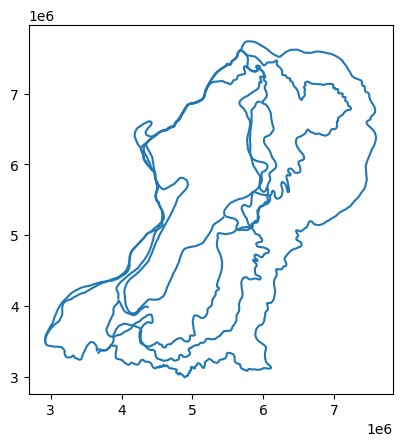

In [102]:
# Print dataframe
hist_glacier_margins.plot()

In [103]:
# Reset index
hist_glacier_margins.reset_index(drop=True, inplace=True)

### 3.7 Glacier dataset with glacier margins between 25ka and 10ka 

This glacier dataset contains glacier margins that existed in northern europe between 25ka and 10ka (Elster, Saale and Weichsel glaciation). Please see: https://doi.pangaea.de/10.1594/PANGAEA.848117?format=html#download

In [104]:
# Print dataframe
glacier_margins_minMax

,ID1,AV_Time,Shape_Leng,Shape_Area,layer,path,geometry
0,1.0,10.0,2.496705e+06,2.303584e+11,TS10_max,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((4188996.264 4268491.703, 4188991.248..."
1,3.0,10.0,1.831332e+05,1.666865e+09,TS10_max,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((4500907.545 6289019.600, 4500471.444..."
2,6.0,10.0,1.098204e+05,5.788470e+08,TS10_max,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((4637289.584 6098762.677, 4638515.662..."
3,10.0,10.0,2.785359e+05,1.919406e+09,TS10_max,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((4480800.535 6028243.400, 4481228.552..."
4,11.0,10.0,4.109616e+05,2.883800e+09,TS10_max,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((4405551.027 6125927.114, 4405297.613..."
...,...,...,...,...,...,...,...
120,3.0,24.0,4.838433e+06,1.316768e+12,TS24_min,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((5659123.547 6674996.941, 5661114.753..."
121,1.0,25.0,1.297125e+07,4.956297e+12,TS25_max,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((5611273.091 6961423.217, 5612866.845..."
122,1.0,25.0,5.032680e+06,1.064539e+12,TS25_min,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((4520248.844 6447067.148, 4521155.367..."
123,2.0,25.0,5.854397e+06,1.805562e+12,TS25_min,/Users/gtom/Downloads/DATED1 TimeSlices shp/TS...,"POLYGON ((5275537.373 4324483.438, 5275198.142..."


In [105]:
# Insert Reference
glacier_margins_minMax["Ref_data"] = "Hughes, Anna L C; Gyllencreutz, Richard; Lohne, Øystein S; Mangerud, Jan; Svendsen, John-Inge (2015): The last Eurasian ice sheets - a chronological database and time-slice reconstruction, DATED-1."

In [106]:
# Insert Reference-link
glacier_margins_minMax["Ref_link"] = "https://doi.pangaea.de/10.1594/PANGAEA.848117?format=html#download"

In [107]:
# Check coordinate system
glacier_margins_minMax.crs is None

False

In [108]:
# Check coordinate system
glacier_margins_minMax.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Europ

In [109]:
# Drop columns
glacier_margins_minMax.drop(['path', 'ID1', "Shape_Leng", "Shape_Area"], axis=1, inplace = True)

In [110]:
# Rename columns
glacier_margins_minMax.rename(columns={'AV_Time': 'Glacier_margin_time_in_ka'}, inplace=True)

<AxesSubplot:>

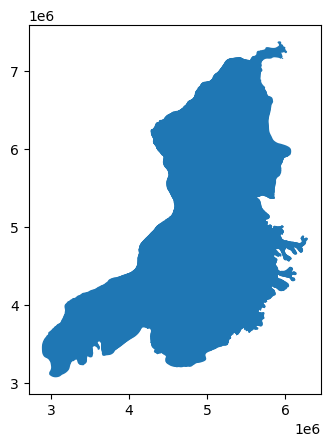

In [111]:
# Plot dataframe
glacier_margins_minMax.plot()

In [112]:
# Reset index
glacier_margins_minMax.reset_index(drop=True, inplace=True)

In [113]:
# Print dataframe
glacier_margins_minMax

,Glacier_margin_time_in_ka,layer,geometry,Ref_data,Ref_link
0,10.0,TS10_max,"POLYGON ((4188996.264 4268491.703, 4188991.248...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
1,10.0,TS10_max,"POLYGON ((4500907.545 6289019.600, 4500471.444...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
2,10.0,TS10_max,"POLYGON ((4637289.584 6098762.677, 4638515.662...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
3,10.0,TS10_max,"POLYGON ((4480800.535 6028243.400, 4481228.552...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
4,10.0,TS10_max,"POLYGON ((4405551.027 6125927.114, 4405297.613...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
...,...,...,...,...,...
120,24.0,TS24_min,"POLYGON ((5659123.547 6674996.941, 5661114.753...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
121,25.0,TS25_max,"POLYGON ((5611273.091 6961423.217, 5612866.845...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
122,25.0,TS25_min,"POLYGON ((4520248.844 6447067.148, 4521155.367...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...
123,25.0,TS25_min,"POLYGON ((5275537.373 4324483.438, 5275198.142...","Hughes, Anna L C; Gyllencreutz, Richard; Lohne...",https://doi.pangaea.de/10.1594/PANGAEA.848117?...


### 3.8 Additional glacier dataset with glacier margins between 22ka and 9ka 

This addtional glacier dataset contains glacier margins that existed in northern europe between 22ka and 9ka (Elster, Saale and Weichsel glaciation). Please see: https://www.sciencedirect.com/science/article/pii/S0277379115301141

In [114]:
# Print dataframe
glacier_margins_stroeven

,Id,year,year2,Comment,geometry
0,0,0,11.5,None,"LINESTRING (-41250.171 6618703.507, -45511.943..."
1,0,0,10.7,None,"MULTILINESTRING ((-48855.675 6722023.345, -359..."
2,0,0,10.2,None,"LINESTRING (-134167.613 6771531.086, -108238.9..."
3,0,0,10.8,None,"MULTILINESTRING ((-181826.200 6634976.676, -18..."
4,0,0,11.1,None,"LINESTRING (622078.874 6761326.554, 598476.576..."
5,0,0,10.3,None,"LINESTRING (-297464.563 6632904.008, -293654.5..."
6,0,0,10.4,None,"LINESTRING (-126067.811 6730730.509, -135443.4..."
7,0,0,11.4,None,"LINESTRING (-297090.821 6562016.610, -298942.9..."
8,0,0,10.5,None,"LINESTRING (820549.100 7305970.848, 820544.825..."
9,0,0,11.3,None,"LINESTRING (675261.799 6773280.514, 662690.408..."


In [115]:
# Insert Reference
glacier_margins_stroeven["Ref_data"] = "Arjen P. Stroeven et al. (2016): Deglaciation of Fennoscandia."

In [116]:
# Insert Reference-link
glacier_margins_stroeven["Ref_link"] = "https://www.sciencedirect.com/science/article/pii/S0277379115301141"

In [117]:
# Check coordinate system
glacier_margins_stroeven.crs is None

False

In [118]:
# Check coordinate system
glacier_margins_stroeven.crs

<Derived Projected CRS: EPSG:32634>
Name: WGS 84 / UTM zone 34N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 18°E and 24°E, northern hemisphere between equator and 84°N, onshore and offshore. Albania. Belarus. Bosnia and Herzegovina. Bulgaria. Central African Republic. Chad. Croatia. Democratic Republic of the Congo (Zaire). Estonia. Finland. Greece. Hungary. Italy. Kosovo. Latvia. Libya. Lithuania. Montenegro. North Macedonia. Norway, including Svalbard and Bjornoys. Poland. Romania. Russian Federation. Serbia. Slovakia. Sudan. Sweden. Ukraine.
- bounds: (18.0, 0.0, 24.0, 84.0)
Coordinate Operation:
- name: UTM zone 34N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [119]:
# Set coordinate system
glacier_margins_stroeven = glacier_margins_stroeven.set_crs('epsg:32634')

In [120]:
# Transformation due to the coordinate system
glacier_margins_stroeven.to_crs(3035, inplace = True)

In [121]:
# Check coordinate system
glacier_margins_stroeven.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Europ

In [122]:
# Drop columns
glacier_margins_stroeven.drop(['Id'], axis=1, inplace = True)

In [123]:
# Rename columns
glacier_margins_stroeven.rename(columns={'year2': 'Glacier_margin_time_in_ka'}, inplace=True)

<AxesSubplot:>

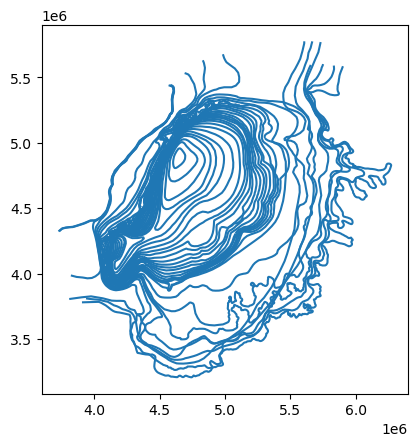

In [124]:
# Plot dataframe
glacier_margins_stroeven.plot()

In [125]:
# Reset index
glacier_margins_stroeven.reset_index(drop=True, inplace=True)

In [126]:
# Print dataframe
glacier_margins_stroeven

,year,Glacier_margin_time_in_ka,Comment,geometry,Ref_data,Ref_link
0,0,11.5,None,"LINESTRING (4404169.787 4029317.976, 4399182.9...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
1,0,10.7,None,"MULTILINESTRING ((4379624.125 4129409.805, 439...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
2,0,10.2,None,"LINESTRING (4287352.062 4163794.689, 4308617.9...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
3,0,10.8,None,"MULTILINESTRING ((4263118.585 4022263.172, 425...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
4,0,11.1,None,"LINESTRING (5036287.511 4274822.970, 5019923.7...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
5,0,10.3,None,"LINESTRING (4149900.031 4001116.205, 4154867.6...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
6,0,10.4,None,"LINESTRING (4302122.959 4125205.452, 4294240.4...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
7,0,11.4,None,"LINESTRING (4161917.523 3931923.028, 4159880.2...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
8,0,10.5,None,"LINESTRING (5142388.905 4840903.994, 5144603.8...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...
9,0,11.3,None,"LINESTRING (5086921.186 4294742.152, 5077274.4...",Arjen P. Stroeven et al. (2016): Deglaciation ...,https://www.sciencedirect.com/science/article/...


### 3.9 OpenStreetMap dataset 

The OpenStreetMap dataset contains roads, railways and buildings. Please see: https://download.geofabrik.de/europe/sweden.html

#### 3.9.1 OSM roads dataset 

In [127]:
# Insert Reference
osm_roads["Ref_data"] = "OpenStreetMap - Roads layer"

In [128]:
# Insert Reference-link
osm_roads["Ref_link"] = "https://download.geofabrik.de/europe/sweden.html"

In [129]:
# Transformation due to the coordinate system of the osm dataset
osm_roads.to_crs(3035, inplace = True)

In [130]:
# Set coordinate system
osm_roads.set_crs('epsg:3035', inplace=True)

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry,Ref_data,Ref_link
0,1240,5121,unclassified,Klensmedsvägen,None,B,30,0,F,F,"LINESTRING (4776148.336 4047401.548, 4776159.5...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
1,1241,5122,residential,Hyvelvägen,None,B,30,0,F,F,"LINESTRING (4776284.092 4047392.759, 4776267.0...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
2,1242,5122,residential,Spikvägen,None,B,30,0,F,F,"LINESTRING (4776335.611 4047369.947, 4776316.5...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
3,1243,5122,residential,Bultvägen,None,B,30,0,F,F,"LINESTRING (4776388.834 4047344.876, 4776385.1...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
4,1246,5122,residential,Borrvägen,None,B,30,0,F,F,"LINESTRING (4776601.618 4047226.657, 4776586.5...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1834956,1113158414,5142,track,None,None,B,0,0,F,F,"LINESTRING (4664295.316 4125023.659, 4664309.4...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
1834957,1113158415,5142,track,None,None,B,0,0,F,F,"LINESTRING (4661516.322 4126044.268, 4661466.5...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
1834958,1113158416,5142,track,None,None,B,0,0,F,F,"LINESTRING (4661794.090 4126451.987, 4661813.1...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html
1834959,1113159126,5122,residential,Handelsmyntet,None,B,0,0,F,F,"LINESTRING (4436077.698 3842679.395, 4436079.2...",OpenStreetMap - Roads layer,https://download.geofabrik.de/europe/sweden.html


In [131]:
# Drop columns
osm_roads.drop(['osm_id', 'code', 'layer'], axis=1, inplace = True)

In [132]:
# Reset index
osm_roads.reset_index(drop=True, inplace=True)

#### 3.9.2 OSM railways dataset 

In [133]:
# Insert Reference
osm_railways["Ref_data"] = "OpenStreetMap - Railways layer"

In [134]:
# Insert Reference-link
osm_railways["Ref_link"] = "https://download.geofabrik.de/europe/sweden.html"

In [135]:
# Transformation due to the coordinate system of the osm dataset
osm_railways.to_crs(3035, inplace = True)

In [136]:
# Set coordinate system
osm_railways.set_crs('epsg:3035', inplace=True)

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry,Ref_data,Ref_link
0,1626206,6101,rail,Godsstråket genom Bergslagen,0,F,F,"LINESTRING (4622587.872 3926228.089, 4622576.5...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
1,1709979,6101,rail,Västra stambanan,0,F,F,"LINESTRING (4775717.800 4039932.584, 4775696.6...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
2,1766362,6101,rail,None,0,F,F,"LINESTRING (4779590.214 4051416.237, 4779591.9...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
3,1880525,6101,rail,Godsstråket genom Bergslagen,0,F,F,"LINESTRING (4619299.026 3982701.458, 4619303.4...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
4,1881683,6101,rail,None,0,F,F,"LINESTRING (4777733.811 4049644.032, 4777747.9...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
...,...,...,...,...,...,...,...,...,...,...
25732,1110730325,6101,rail,None,0,F,F,"LINESTRING (4612002.059 4006002.204, 4612047.7...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
25733,1110730326,6101,rail,None,0,F,F,"LINESTRING (4612203.663 4006067.262, 4612245.7...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
25734,1110730327,6101,rail,None,0,F,F,"LINESTRING (4612047.744 4006015.823, 4612087.2...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
25735,1112135042,6101,rail,None,0,F,T,"LINESTRING (4610841.905 4005536.497, 4610955.6...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html


In [137]:
# Drop columns
osm_railways.drop(['osm_id', 'code', 'layer'], axis=1, inplace = True)

In [138]:
# Review geodataframe
osm_railways

,fclass,name,bridge,tunnel,geometry,Ref_data,Ref_link
0,rail,Godsstråket genom Bergslagen,F,F,"LINESTRING (4622587.872 3926228.089, 4622576.5...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
1,rail,Västra stambanan,F,F,"LINESTRING (4775717.800 4039932.584, 4775696.6...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
2,rail,None,F,F,"LINESTRING (4779590.214 4051416.237, 4779591.9...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
3,rail,Godsstråket genom Bergslagen,F,F,"LINESTRING (4619299.026 3982701.458, 4619303.4...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
4,rail,None,F,F,"LINESTRING (4777733.811 4049644.032, 4777747.9...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
...,...,...,...,...,...,...,...
25732,rail,None,F,F,"LINESTRING (4612002.059 4006002.204, 4612047.7...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
25733,rail,None,F,F,"LINESTRING (4612203.663 4006067.262, 4612245.7...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
25734,rail,None,F,F,"LINESTRING (4612047.744 4006015.823, 4612087.2...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html
25735,rail,None,F,T,"LINESTRING (4610841.905 4005536.497, 4610955.6...",OpenStreetMap - Railways layer,https://download.geofabrik.de/europe/sweden.html


In [139]:
# Reset index
osm_railways.reset_index(drop=True, inplace=True)

#### 3.9.3 OSM buildings dataset; this dataset increases the csv-file

In [140]:
# Insert Reference
#osm_buildings["Ref_data"] = "OpenStreetMap - Buildings layer"

In [141]:
# Insert Reference-link
#osm_buildings["Ref_link"] = "https://download.geofabrik.de/europe/sweden.html"

In [142]:
# Transformation due to the coordinate system of the osm dataset
#osm_buildings.to_crs(3035, inplace = True)

In [143]:
# Set coordinate system
#osm_buildings.set_crs('epsg:3035', inplace=True)

In [144]:
# Drop columns
#osm_buildings.drop(['osm_id', 'code'], axis=1, inplace = True)

In [145]:
# Reset index
#osm_buildings.reset_index(drop=True, inplace=True)

## 4. Combine datasets

### 4.1 Combine with gdf_archo_qual dataset, without spatial join (if needed) 

In [ ]:
# Select columns for merge (concat)
#geoframes = [gdf_archo_qual, soil_atlas_clipped_df, CLC_2018_clipped_df, glacier_inv, hist_glacier_margins, osm_roads, osm_railways] 

In [ ]:
# Combine geodatasets
#gdf_archo_soil_CLC_glaciers = gpd.GeoDataFrame(pd.concat(geoframes, ignore_index=True), crs=geoframes[0].crs)

In [ ]:
# Reset index of geodataframe
#gdf_archo_soil_CLC_glaciers.reset_index(inplace=True)

In [ ]:
# Print geodataframe
#gdf_archo_soil_CLC_glaciers.head()

In [ ]:
# Drop columns
#gdf_archo_soil_CLC_glaciers.drop(['index', 'Latitude', 'Longitude'], axis=1, inplace=True)

In [ ]:
# Insert coordinate column with values
#gdf_archo_soil_CLC_glaciers["coordinate_system"] = "EPSG: 4326"

In [ ]:
# Print geodataframe
#gdf_archo_soil_CLC_glaciers

In [ ]:
# Replace empty column with NaN (string)
#archoPub_soil_CLC2018_glaciers = gdf_archo_soil_CLC_glaciers.replace(r'^\s*$', 'NaN', regex=True)

In [ ]:
# Replace nan with NaN (string) 
#archoPub_soil_CLC2018_glaciers = archoPub_soil_CLC2018_glaciers.replace(np.nan, 'NaN', regex=True)

### 4.2 Combine with fornsok dataset, without spatial join (if needed) 

In [ ]:
# Select columns for merge (concat)
#geoframes1 = [gdf_fornsok_data, soil_atlas_clipped_df, CLC_2018_clipped_df, glacier_inv, hist_glacier_margins, osm_roads, osm_railways] 

In [ ]:
# Combine geodatasets
#gdf_fornsok_soil_CLC_glaciers = gpd.GeoDataFrame(pd.concat(geoframes1, ignore_index=True), crs=geoframes1[0].crs)

In [ ]:
# Insert coordinate column with values
#gdf_fornsok_soil_CLC_glaciers["coordinate_system"] = "EPSG: 4326"

In [ ]:
# Reset index of geodataframe
#gdf_fornsok_soil_CLC_glaciers.reset_index(inplace=True)

In [ ]:
# Print geodataframe
#gdf_fornsok_soil_CLC_glaciers.head()

In [ ]:
# Drop columns
#gdf_fornsok_soil_CLC_glaciers.drop(['index', 'nuvarande_lage.geometri.crs.properties.name', 'nuvarande_lage.geometri.crs.type', "nuvarande_lage.geometri.type", "lamning_id", "lamningsversionstyp", "nuvarande_lage.matmetodtyp_id", "nuvarande_lage.registreringsunderlagkvalitettyp_namn", "nuvarande_lage.registreringsunderlagkvalitettyp_id", "nuvarande_lage.registreringsunderlagtyp_namn", "nuvarande_lage.registreringsunderlagtyp_id", "skadestatus.skadestatustyp_namn", "skadestatus.skadestatustyp_id", "undersokningsstatus.undersokningsstatustyp_namn", "undersokningsstatus.undersokningsstatustyp_id", "aktualitetstatus.aktualitetstatustyp_namn", "aktualitetstatus.aktualitetstatustyp_id", "aktivitetsref.senast_andrad", "aktivitetsref.registreringstid", "aktivitetsref.referens", "aktivitetsref.beskrivning", "aktivitetsref.atgardtyp_namn", "aktivitetsref.atgardtyp_id", "aktivitetsref.atgardsnummer", "aktivitetsref.atgard_id", "aktivitetsref.aktivitetstyp", "publicerad_av_organisation", "publiceringsdatum", "registrerare_organisationsnamn", "senast_andrad", "arkivobjekt_id", "placeringtyp_id", "rekommenderad_antikvariskbedomningtyp_id", "antikvariskbedomningtyp_id", "lamningstyp_id", "lamningsnummer", "legacy.fmis_id", "legacy.raa_nummer", "aktivitetsref.uppdrag_id", "aktivitetsref.uppdragsnummer"], axis=1, inplace=True)

In [ ]:
# Print geodataframe
#gdf_fornsok_soil_CLC_glaciers

In [ ]:
# Replace empty column with NaN (string)
#fornsok_soil_CLC2018_glaciers = gdf_fornsok_soil_CLC_glaciers.replace(r'^\s*$', 'NaN', regex=True)

In [ ]:
# Replace nan with NaN (string) 
#fornsok_soil_CLC2018_glaciers = fornsok_soil_CLC2018_glaciers.replace(np.nan, 'NaN', regex=True)

### 4.3 Spatial Join within gdf_archo_qual dataset

In [146]:
# Implement nearest spatial join
gdf_archoPub_soil = gpd.sjoin_nearest(gdf_archo_qual1, soil_atlas_clipped_df, how = "left", lsuffix = "archoPub", rsuffix = "soil", distance_col="distances_soil")

In [147]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018 = gpd.sjoin_nearest(gdf_archoPub_soil, CLC_2018_clipped_df, how = "left", rsuffix = "CLC2018", distance_col="distances_CLC2018")

In [148]:
# Rename columns
gdf_archoPub_soil_CLC2018.rename(columns={'Ref_data': 'Ref_data_CLC2018', 'Ref_link': 'Ref_link_CLC2018'}, inplace=True)

In [149]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018_roads = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018, osm_roads, how = "left", rsuffix = "osmRoads", distance_col="distances_osmRoads")

In [150]:
# Rename columns
gdf_archoPub_soil_CLC2018_roads.rename(columns={'Ref_data': 'Ref_data_osmRoads', 'Ref_link': 'Ref_link_osmRoads'}, inplace=True)

In [151]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018_roads_railways = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018_roads, osm_railways, how = "left", rsuffix = "osmRailways", distance_col="distances_osmRailways")

In [152]:
# Rename columns
gdf_archoPub_soil_CLC2018_roads_railways.rename(columns={'Ref_data': 'Ref_data_osmRailways', 'Ref_link': 'Ref_link_osmRailways'}, inplace=True)

In [153]:
# Implement nearest spatial join
#gdf_archoPub_soil_CLC2018_roads_railways_buildings = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018_roads_railways, osm_buildings, how = "left", rsuffix = "osmBuildings", distance_col="distances_osmBuildings")

In [154]:
# Rename columns
#gdf_archoPub_soil_CLC2018_roads_railways_buildings.rename(columns={'Ref_data': 'Ref_data_osmBuildings', 'Ref_link': 'Ref_link_osmBuildings'}, inplace=True)

In [155]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018_roads_railways, glacier_inv, how = "left", rsuffix = "glacierInv", distance_col="distances_glacierInv")

In [156]:
# Rename columns
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv.rename(columns={'Ref_data': 'Ref_data_glacierInv', 'Ref_link': 'Ref_link_glacierInv'}, inplace=True)

In [157]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018_roads_railways_glacierInv, hist_glacier_margins, how = "left", rsuffix = "histGlacier", distance_col="distances_histGlacier")

In [158]:
# Rename columns
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier.rename(columns={'Ref_data': 'Ref_data_histGlacier', 'Ref_link': 'Ref_link_histGlacier'}, inplace=True)

In [159]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier, glacier_margins_minMax, how = "left", rsuffix = "glacierMinMax", distance_col="distances_glacierMinMax")

In [160]:
# Rename columns
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax.rename(columns={'Ref_data': 'Ref_data_glacierMinMax', 'Ref_link': 'Ref_link_glacierMinMax'}, inplace=True)

In [161]:
# Implement nearest spatial join
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins = gpd.sjoin_nearest(gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax, glacier_margins_stroeven, how = "left", rsuffix = "addMargins", distance_col="distances_addMargins")

In [162]:
# Rename columns
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.rename(columns={'Ref_data': 'Ref_data_addMargins', 'Ref_link': 'Ref_link_addMargins'}, inplace=True)

In [163]:
# Drop columns
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(['index_soil', 'index_CLC2018', 'index_osmRoads','index_osmRailways', "index_glacierInv", "index_histGlacier", "index_glacierMinMax", "index_addMargins"], axis=1, inplace = True)

In [164]:
# Drop duplicates
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop_duplicates(keep=False, inplace=True)

#### Directly implented, because of the increasing .csv size

In [165]:
# Insert coordinate column with values
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins["coordinate_system"] = "EPSG: 4326"

In [166]:
# Reset index of geodataframe
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.reset_index(inplace=True)

In [167]:
# Replace empty column with NaN (string)
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins = gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.replace(r'^\s*$', 'NaN', regex=True)

In [168]:
# Replace NaN column with NaN (string)
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins = gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.replace(np.nan, 'NaN', regex=True)

In [169]:
# Drop columns
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(['RGIId'], axis=1, inplace = True)

In [170]:
# Reset index
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.reset_index(inplace=True)

In [171]:
# Drop index column
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(['index', 'level_0'], axis=1, inplace = True)

In [172]:
# Transformation due to the coordinate system
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.to_crs(4326, inplace = True)

In [173]:
# Print crs
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [174]:
# Drop duplicates
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop_duplicates(keep=False, inplace=True)

#### Not implented, because of the increasing .csv size

In [ ]:
# Select columns for merge (concat)
#geoframes = [gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax, glacier_inv, hist_glacier_margins, glacier_margins_minMax] 

In [ ]:
# Concat (merge) geoframes
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers = gpd.GeoDataFrame(pd.concat(geoframes, ignore_index=True), crs=geoframes[0].crs)

In [ ]:
# Drop columns
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.drop(['Latitude', 'Longitude'], axis=1, inplace=True)

In [ ]:
# Insert coordinate column with values
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers["coordinate_system"] = "EPSG: 4326"

In [ ]:
# Reset index of geodataframe
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.reset_index(inplace=True)

In [ ]:
# Replace empty column with NaN (string)
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers = gdf_archoPub_soil_CLC2018_roads_railways_glaciers.replace(r'^\s*$', 'NaN', regex=True)

In [ ]:
# Replace NaN column with NaN (string)
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers = gdf_archoPub_soil_CLC2018_roads_railways_glaciers.replace(np.nan, 'NaN', regex=True)

In [ ]:
# Drop columns
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.drop(['RGIId'], axis=1, inplace = True)

In [ ]:
# Reset index
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.reset_index(inplace=True)

In [ ]:
# Drop index column
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.drop(['index', 'level_0'], axis=1, inplace = True)

In [ ]:
# Review geodataframe
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers

In [ ]:
# Transformation due to the coordinate system
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.to_crs(4326, inplace = True)

In [ ]:
# Print crs
#gdf_archoPub_soil_CLC2018_roads_railways_glaciers.crs

### 4.4 Spatial Join within fornsok dataset

In [175]:
# Implement nearest spatial join
gdf_fornsok_soil = gpd.sjoin_nearest(gdf_fornsok_data, soil_atlas_clipped_df, how = "left", lsuffix = "fornsok", rsuffix = "soil", distance_col="distances_soil")

In [176]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018 = gpd.sjoin_nearest(gdf_fornsok_soil, CLC_2018_clipped_df, how = "left", rsuffix = "CLC2018", distance_col="distances_CLC2018")

In [177]:
# Rename columns
gdf_fornsok_soil_CLC2018.rename(columns={'Ref_data': 'Ref_data_CLC2018', 'Ref_link': 'Ref_link_CLC2018'}, inplace=True)

In [178]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018_roads = gpd.sjoin_nearest(gdf_fornsok_soil_CLC2018, osm_roads, how = "left", rsuffix = "osmRoads", distance_col="distances_osmRoads")

In [179]:
# Rename columns
gdf_fornsok_soil_CLC2018_roads.rename(columns={'Ref_data': 'Ref_data_osmRoads', 'Ref_link': 'Ref_link_osmRoads'}, inplace=True)

In [180]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018_roads_railways = gpd.sjoin_nearest(gdf_fornsok_soil_CLC2018_roads, osm_railways, how = "left", rsuffix = "osmRailways", distance_col="distances_osmRailways")

In [181]:
# Rename columns
gdf_fornsok_soil_CLC2018_roads_railways.rename(columns={'Ref_data': 'Ref_data_osmRailways', 'Ref_link': 'Ref_link_osmRailways'}, inplace=True)

In [182]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv = gpd.sjoin_nearest(gdf_fornsok_soil_CLC2018_roads_railways, glacier_inv, how = "left", rsuffix = "glacierInv", distance_col="distances_glacierInv")

In [183]:
# Rename columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv.rename(columns={'Ref_data': 'Ref_data_glacierInv', 'Ref_link': 'Ref_link_glacierInv'}, inplace=True)

In [184]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier = gpd.sjoin_nearest(gdf_fornsok_soil_CLC2018_roads_railways_glacierInv, hist_glacier_margins, how = "left", rsuffix = "histGlacier", distance_col="distances_histGlacier")

In [185]:
# Rename columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier.rename(columns={'Ref_data': 'Ref_data_histGlacier', 'Ref_link': 'Ref_link_histGlacier'}, inplace=True)

In [186]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax = gpd.sjoin_nearest(gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier, glacier_margins_minMax, how = "left", rsuffix = "glacierMinMax", distance_col="distances_glacierMinMax")

In [187]:
# Rename columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax.rename(columns={'Ref_data': 'Ref_data_glacierMinMax', 'Ref_link': 'Ref_link_glacierMinMax'}, inplace=True)

In [188]:
# Implement nearest spatial join
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins = gpd.sjoin_nearest(gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax, glacier_margins_stroeven, how = "left", rsuffix = "addMargins", distance_col="distances_addMargins")

In [189]:
# Rename columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.rename(columns={'Ref_data': 'Ref_data_addMargins', 'Ref_link': 'Ref_link_addMargins'}, inplace=True)

In [190]:
# Drop columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(['index_soil', 'index_CLC2018', 'index_osmRoads','index_osmRailways', "index_glacierInv", "index_histGlacier", "index_glacierMinMax", "index_addMargins"], axis=1, inplace = True)

In [191]:
# Drop duplicates
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop_duplicates(keep=False, inplace=True)

#### Directly implented, because of the increasing .csv size

In [192]:
# Insert coordinate column with values
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins["coordinate_system"] = "EPSG: 4326"

In [193]:
# Reset index of geodataframe
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.reset_index(inplace=True)

In [194]:
# Drop columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(['index', "RGIId"], axis=1, inplace=True)

In [195]:
# Replace empty column with NaN (string)
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins = gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.replace(r'^\s*$', 'NaN', regex=True)

In [196]:
# Replace nan with NaN (string) 
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins = gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.replace(np.nan, 'NaN', regex=True)

In [197]:
# Reset index
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.reset_index(inplace=True)

/var/folders/4f/l7csf03s5xn_5cy1jplzwx2m0000gn/T/ipykernel_26319/1099746605.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.reset_index(inplace=True)


In [198]:
# Drop index column
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(['index'], axis=1, inplace = True)

In [199]:
# Transformation due to the coordinate system
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.to_crs(4326, inplace = True)

In [200]:
# Print crs
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [201]:
# Drop duplicates
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop_duplicates(keep=False, inplace=True)

In [202]:
# Print dataframe
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.head(5)

lamningstyp_namn antikvariskbedomningtyp_namn  \
0       Blästplats                  Fornlämning   
1       Blästplats                  Fornlämning   
2       Blästplats                  Fornlämning   
3       Blästplats                  Fornlämning   
4       Blästplats                  Fornlämning   

  antikvariskbedomning_motivering  \
0                             NaN   
1                             NaN   
2                             NaN   
3                             NaN   
4                             NaN   

                               antikvarisk_kommentar  \
0  2008-04-16 \nOmrådets läge och utbredning inmä...   
1  2008-04-16 \nOmrådets läge och utbredning inmä...   
2  2008-04-16 \nOmrådets läge och utbredning inmä...   
3  2008-04-16 \nOmrådets läge och utbredning inmä...   
4  2008-04-16 \nOmrådets läge och utbredning inmä...   

  rekommenderad_antikvariskbedomningtyp_namn  \
0                                Fornlämning   
1                                Fornlämning   
2                                Fornlämning   
3                                Fornlämning   
4                                Fornlämning   

                                         beskrivning  \
0  Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
1  Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
2  Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
3  Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   
4  Blästplats, 70x20 m (NNV-SSÖ), bestående av 5 ...   

  ingaendelamningar_0_lamningstyp_id ingaendelamningar_0_lamningstyp_namn  \
0                             1009.0                    Blästbrukslämning   
1                             1009.0                    Blästbrukslämning   
2                             1009.0                    Blästbrukslämning   
3                             1009.0                    Blästbrukslämning   
4                             1009.0                    Blästbrukslämning   

  ingaendelamningar_0_antal ingaendelamningar_0_egenskaper_0_egenskapstyp_id  \
0                       6.0                                          10006.0   
1                       6.0                                          10006.0   
2                       6.0                                          10006.0   
3                       6.0                                          10006.0   
4                       6.0                                          10006.0   

  ingaendelamningar_0_egenskaper_0_egenskapstyp_namn  \
0                                                Typ   
1                                                Typ   
2                                                Typ   
3                                                Typ   
4                                                Typ   

  ingaendelamningar_0_egenskaper_0_egenskapsvarden_0_egenskapsvarde_id  \
0                                               23.0                     
1                                               23.0                     
2                                               23.0                     
3                                               23.0                     
4                                               23.0                     

  ingaendelamningar_0_egenskaper_0_egenskapsvarden_0_egenskapsvarde_namn  \
0                                    Slagg/Slaggvarp                       
1                                    Slagg/Slaggvarp                       
2                                    Slagg/Slaggvarp                       
3                                    Slagg/Slaggvarp                       
4                                    Slagg/Slaggvarp                       

  ingaendelamningar_1_lamningstyp_id ingaendelamningar_1_lamningstyp_namn  \
0                             1075.0                   Kolningsanläggning   
1                             1075.0                   Kolningsanläggning   
2                             1075.0                   Kolningsanläggning   
3                 

In [203]:
# Drop columns
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.drop(gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.filter(regex='nuvarande_lage.geometri.features|ingaendelamningar_|egenskaper_|skriftlig_kalla_referenser|ursprungligt_lage.geometri.features_').columns, axis=1, inplace=True)

In [204]:
# Print dataframe
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins

,lamningstyp_namn,antikvariskbedomningtyp_namn,antikvariskbedomning_motivering,antikvarisk_kommentar,rekommenderad_antikvariskbedomningtyp_namn,beskrivning,kartmaterial_referenser_0_kartarkivtyp_id,kartmaterial_referenser_0_kartarkivtyp_namn,kartmaterial_referenser_0_karttyp_id,kartmaterial_referenser_0_karttyp_namn,kartmaterial_referenser_0_kartakt,kartmaterial_referenser_0_kommentar,placeringtyp_namn,faltdatum,orientering,terrang,vegetation,tradition,ursprungligt_lage,reserverad_av_organisationsnamn,reserverad_info,uri,aktualitetstatus.aktualitetstatus_kommentar,undersokningsstatus.undersokningsstatus_kommentar,skadestatus.skadestatus_kommentar,nuvarande_lage.matmetodtyp_namn,nuvarande_lage.felmarginal_meter,nuvarande_lage.min_meter_over_havet,nuvarande_lage.max_meter_over_havet,nuvarande_lage.centrum.ost,nuvarande_lage.centrum.nord,nuvarande_lage.inmatning_kommentar,nuvarande_lage.geografisk_indelning.kommun_0_kommun_kod,nuvarande_lage.geografisk_indelning.kommun_0_kommun_namn,nuvarande_lage.geografisk_indelning.kommun_0_lan_kod,nuvarande_lage.geografisk_indelning.kommun_0_lan_namn,nuvarande_lage.geografisk_indelning.socken_0_socken_id,nuvarande_lage.geografisk_indelning.socken_0_socken_namn,nuvarande_lage.geografisk_indelning.landskap_0_landskap_kod,nuvarande_lage.geografisk_indelning.landskap_0_landskap_namn,legacy,ursprungligt_lage.geometri.type,ursprungligt_lage.geometri.crs.type,ursprungligt_lage.geometri.crs.properties.name,ursprungligt_lage.geometri.features,alternativnamn_0,alternativnamn_1,kartmaterial_referenser_1_kartarkivtyp_id,kartmaterial_referenser_1_kartarkivtyp_namn,kartmaterial_referenser_1_karttyp_id,kartmaterial_referenser_1_karttyp_namn,kartmaterial_referenser_1_kartakt,kartmaterial_referenser_1_kommentar,kartmaterial_referenser_2_kartarkivtyp_id,kartmaterial_referenser_2_kartarkivtyp_namn,kartmaterial_referenser_2_karttyp_id,kartmaterial_referenser_2_karttyp_namn,kartmaterial_referenser_2_kartakt,kartmaterial_referenser_2_kommentar,kartmaterial_referenser_3_kartarkivtyp_id,kartmaterial_referenser_3_kartarkivtyp_namn,kartmaterial_referenser_3_karttyp_id,kartmaterial_referenser_3_karttyp_namn,kartmaterial_referenser_3_kartakt,kartmaterial_referenser_3_kommentar,kartmaterial_referenser_4_kartarkivtyp_id,kartmaterial_referenser_4_kartarkivtyp_namn,kartmaterial_referenser_4_karttyp_id,kartmaterial_referenser_4_karttyp_namn,kartmaterial_referenser_4_kartakt,kartmaterial_referenser_4_kommentar,nuvarande_lage.geografisk_indelning.socken_1_socken_id,nuvarande_lage.geografisk_indelning.socken_1_socken_namn,nuvarande_lage.geografisk_indelning.kommun_1_kommun_kod,nuvarande_lage.geografisk_indelning.kommun_1_kommun_namn,nuvarande_lage.geografisk_indelning.kommun_1_lan_kod,nuvarande_lage.geografisk_indelning.kommun_1_lan_namn,alternativnamn_2,alternativnamn_3,alternativnamn_4,alternativnamn_5,kartmaterial_referenser_5_kartarkivtyp_id,kartmaterial_referenser_5_kartarkivtyp_namn,kartmaterial_referenser_5_karttyp_id,kartmaterial_referenser_5_karttyp_namn,kartmaterial_referenser_5_kartakt,kartmaterial_referenser_5_kommentar,kartmaterial_referenser_6_kartarkivtyp_id,kartmaterial_referenser_6_kartarkivtyp_namn,kartmaterial_referenser_6_karttyp_id,kartmaterial_referenser_6_karttyp_namn,kartmaterial_referenser_6_kartakt,kartmaterial_referenser_6_kommentar,kartmaterial_referenser_7_kartarkivtyp_id,kartmaterial_referenser_7_kartarkivtyp_namn,kartmaterial_referenser_7_karttyp_id,kartmaterial_referenser_7_karttyp_namn,kartmaterial_referenser_7_kartakt,kartmaterial_referenser_7_kommentar,kartmaterial_referenser_8_kartarkivtyp_id,kartmaterial_referenser_8_kartarkivtyp_namn,kartmaterial_referenser_8_karttyp_id,kartmaterial_referenser_8_karttyp_namn,kartmaterial_referenser_8_kartakt,kartmaterial_referenser_8_kommentar,kartmaterial_referenser_9_kartarkivtyp_id,kartmaterial_referenser_9_kartarkivtyp_namn,kartmaterial_referenser_9_karttyp_id,kartmaterial_referenser_9_karttyp_namn,kartmaterial_referenser_9_kartakt,kartmaterial_referens

#### Not implented, because of the increasing .csv size

In [ ]:
# Select columns for merge (concat)
#geoframes1 = [gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax, glacier_inv, hist_glacier_margins, glacier_margins_minMax] 

In [ ]:
# Concat (merge) geoframes
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers = gpd.GeoDataFrame(pd.concat(geoframes1, ignore_index=True), crs=geoframes1[0].crs)

In [ ]:
# Create a copy
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1 = gdf_fornsok_soil_CLC2018_roads_railways_glaciers.copy()

In [ ]:
# Insert coordinate column with values
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1["coordinate_system"] = "EPSG: 4326"

In [ ]:
# Reset index of geodataframe
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.reset_index(inplace=True)

In [ ]:
# Drop columns
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.drop(['index', "RGIId"], axis=1, inplace=True)

In [ ]:
# Replace empty column with NaN (string)
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1 = gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.replace(r'^\s*$', 'NaN', regex=True)

In [ ]:
# Replace nan with NaN (string) 
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1 = gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.replace(np.nan, 'NaN', regex=True)

In [ ]:
# Rename columns
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.rename(columns={'Ref_data': 'Ref_data_glaciers', 'Ref_link': 'Ref_link_glaciers'}, inplace=True)

In [ ]:
# Drop columns
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.drop(['index_soil', 'index_CLC2018', 'index_osmRoads','index_osmRailways', "index_glacierInv", "index_histGlacier", "index_glacierMinMax"], axis=1, inplace = True)

In [ ]:
# Reset index
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.reset_index(inplace=True)

In [ ]:
# Drop index column
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.drop(['index'], axis=1, inplace = True)

In [ ]:
# Review geodataframe
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1

In [ ]:
# Transformation due to the coordinate system
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.to_crs(4326, inplace = True)

In [ ]:
# Print crs
#gdf_fornsok_soil_CLC2018_roads_railways_glaciers1.crs

## 5. Export datasets

In [205]:
# Export .csv based on the publication datset
gdf_archoPub_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.to_csv(r'archaeology/archoPub_soil_CLC2018_glaciers_roads_railways_WGS84_V3.csv')

In [206]:
# Export .csv based on the fornsok datset
gdf_fornsok_soil_CLC2018_roads_railways_glacierInv_histGlacier_glaciermargins_minMax_addMargins.to_csv(r'archaeology/fornsok_soil_CLC2018_glaciers_roads_railways_WGS84_V3.csv')